# Perform clustering (hierarchical,K means clustering and DBSCAN) for the airlines data to obtain optimum number of clusters. Draw the inferences from the clusters obtained.

## Data Description

The file EastWestAirlines contains information on passengers who belong to an airline’s frequent flier program. For each passenger the data include information on their mileage history and on different ways they accrued or spent miles in the last year. The goal is to try to identify clusters of passengers that have similar characteristics for the purpose of targeting different segments for different types of mileage offers

ID --Unique ID

Balance--Number of miles eligible for award travel

Qual_mile--Number of miles counted as qualifying for Topflight status

cc1_miles -- Number of miles earned with freq. flyer credit card in the past 12 months:  
cc2_miles -- Number of miles earned with Rewards credit card in the past 12 months:  
cc3_miles -- Number of miles earned with Small Business credit card in the past 12 months:  

1 = under 5,000  
2 = 5,000 - 10,000  
3 = 10,001 - 25,000  
4 = 25,001 - 50,000  
5 = over 50,000  

Bonus_miles--Number of miles earned from non-flight bonus transactions in the past 12 months

Bonus_trans--Number of non-flight bonus transactions in the past 12 months

Flight_miles_12mo--Number of flight miles in the past 12 months

Flight_trans_12--Number of flight transactions in the past 12 months

Days_since_enrolled--Number of days since enrolled in flier program

Award--whether that person had award flight (free flight) or not

## Exploratory Data Analysis

In [1]:
# importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage 

In [2]:
# loading the dataset
df = pd.read_excel('EastWestAirlines.xlsx', sheet_name = 'data')
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [3]:
# getting shape of data, column names, and number of na values for each
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


All columns are of integer data type. However, some are categorical in nature

In [4]:
# rechecking na values
df.isna().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

No na values

In [5]:
# Finding unique values in each column
df.nunique()

ID#                  3999
Balance              3904
Qual_miles            164
cc1_miles               5
cc2_miles               3
cc3_miles               5
Bonus_miles          2734
Bonus_trans            57
Flight_miles_12mo     343
Flight_trans_12        35
Days_since_enroll    2820
Award?                  2
dtype: int64

ID# is not relevant, so let's delete it : 

In [6]:
df.drop(columns=['ID#'], inplace = True)

Let's rename Award? to free_flight :

In [7]:
df.rename(columns = {'Award?':'free_flight'}, inplace=True)

In [8]:
df.free_flight.value_counts()

0    2518
1    1481
Name: free_flight, dtype: int64

<Axes: xlabel='Balance', ylabel='Count'>

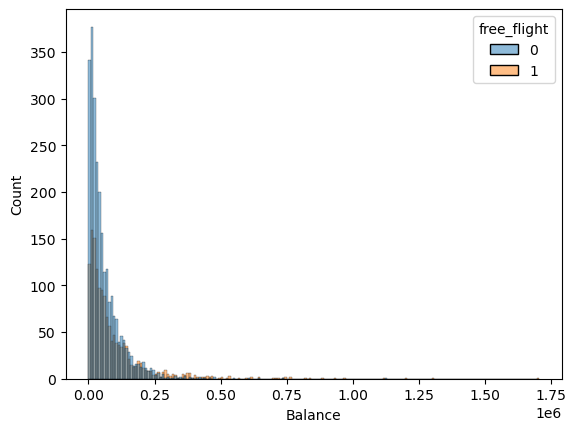

In [9]:
sns.histplot(df, x = 'Balance', hue = 'free_flight')

<Axes: xlabel='Qual_miles', ylabel='Count'>

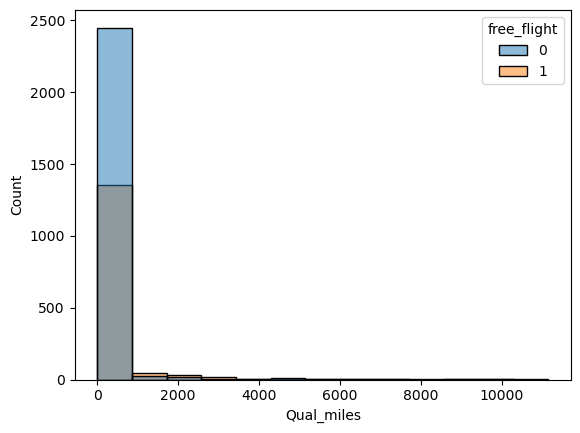

In [10]:
sns.histplot(df, x = 'Qual_miles', hue = 'free_flight')

In [11]:
df.columns

Index(['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight'],
      dtype='object')

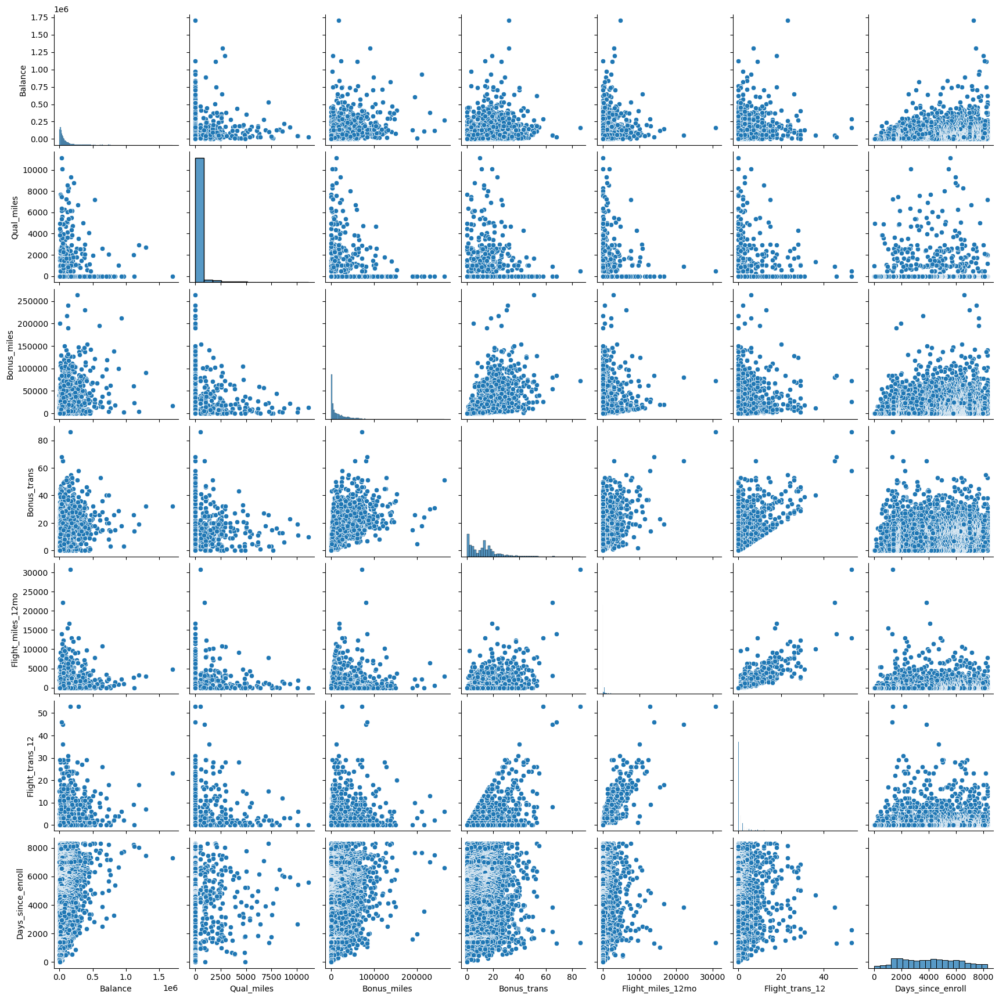

In [12]:
sns.pairplot(df.drop(columns = ['cc1_miles', 'cc2_miles', 'cc3_miles', 'free_flight']))

<Axes: >

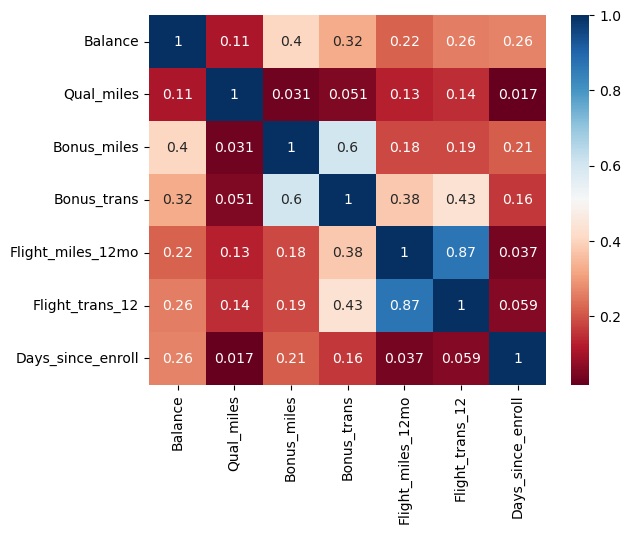

In [13]:
sns.heatmap(df.drop(columns = ['cc1_miles', 'cc2_miles', 'cc3_miles', 'free_flight']).corr(), annot = True, cmap = 'RdBu')

There are no specific inferences to be had from these explorations

## Scaling the Data

In [14]:
# importing necessary libraries
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [15]:
# standardizing the data
std_df = pd.DataFrame(StandardScaler().fit_transform(df), columns = df.columns)

In [16]:
# normalizing the data
norm_df = pd.DataFrame(MinMaxScaler().fit_transform(df), columns = df.columns)

## Hierarchical Clustering

### On raw data

In [17]:
# Creating a function to display Silhouette plots for 2 to 5 clusters with their Average Silhouette Scores
def silplot(metric = 'euclidean', linkage = 'ward'):
    range_n_clusters = [i for i in range(2,6)]
    cluster_range_size = len(range_n_clusters)
    # creating subplots for each cluster size
    fig, axes = plt.subplots(2, 2, figsize = (10,10))
    # iterating for each cluster size and creating the plot
    ax = [axes[0,0], axes[0,1], axes[1,0], axes[1,1]]
    for i, n_clusters in enumerate(range_n_clusters):
        # applying hierarchical clustering
        clusterer = AgglomerativeClustering(n_clusters=n_clusters, metric = metric, linkage = linkage)
        # getting labels for each sample
        cluster_labels = clusterer.fit_predict(df)
        # getting average silhouette score
        silhouette_avg = silhouette_score(df, cluster_labels)
        # getting silhouette score for each sample
        sample_silhouette_values = silhouette_samples(df, cluster_labels)
        # creating a list of colors to be used for each cluster to differentiate them
        colors = ['red','orange','yellow','green','blue','indigo','violet']
        # setting a gap of 10 from x axis
        y_lower = 10
        # iterating over each cluster and plotting its silhouette's
        for cl in range(n_clusters):
            # getting silhouette values for ith cluster
            clth_cluster_silhouette_values = sample_silhouette_values[cluster_labels == cl]
            # sorting these values for better visualization
            clth_cluster_silhouette_values.sort()
            # getting size of the cluster
            size_cluster_cl = clth_cluster_silhouette_values.shape[0]
            # creating upper bound on y axis for this cluster
            y_upper = y_lower + size_cluster_cl
            # for the defined y values of this cluster, fill color between 0 and the silhouette value of each sample
            ax[i].fill_betweenx(np.arange(y_lower, y_upper),0,clth_cluster_silhouette_values,color=colors[cl])
            # writing the cluster label at the center of each cluster
            ax[i].text(-0.05, y_lower + 0.5 * size_cluster_cl, str(cl))
            # padding by 10 on y axis before starting to plot the next cluster
            y_lower = y_upper + 10
        ax[i].set_xlabel("Silhouette Coefficient")
        ax[i].set_ylabel("Cluster Number")
        ax[i].axvline(x=silhouette_avg, color="black", linestyle="--")
        ax[i].set_yticks([])
        # We do not expect misclustering to be very high, so setting lowest bound on x axis as -0.4 so that all plots match up of the y axis
        ax[i].set_xticks([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
        ax[i].set_title(f"Score for {n_clusters} clusters = {np.round(silhouette_avg, 3)}",fontsize=14,fontweight="bold")
    plt.tight_layout()
    plt.show()

In [18]:
# getting the best average silhouette score

# As ward linkage can only work with euclidean metric, we have to compute it seperately
print("For ward linkage (which works only with euclidean metric): ")
for i in range(2,6):
    agg = AgglomerativeClustering(n_clusters=i)
    agg.fit(df)
    print(f"For {i} clusters, Average Silhouette Score is {np.round(silhouette_score(df, agg.labels_), 3)}")

For ward linkage (which works only with euclidean metric): 
For 2 clusters, Average Silhouette Score is 0.651
For 3 clusters, Average Silhouette Score is 0.65
For 4 clusters, Average Silhouette Score is 0.612
For 5 clusters, Average Silhouette Score is 0.488


2 clusters gives the best Silhouette Score. Lets plot Silhouette plots for these to get a better understanding of the clusters : 

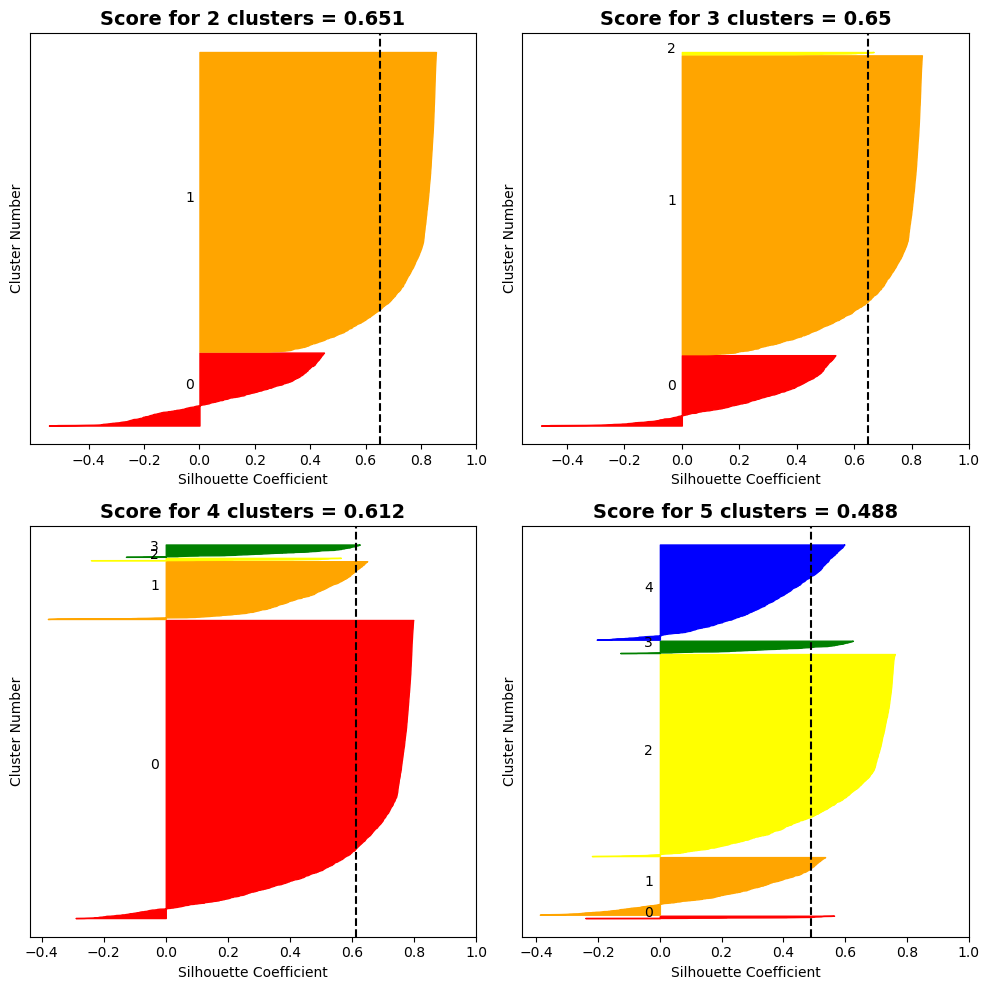

In [19]:
silplot()

All clusters are uneven and include misclustering

In [20]:
# defining different linkages and metrics
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['single', 'average', 'complete']

For Single Linkage :
For euclidean metric : 


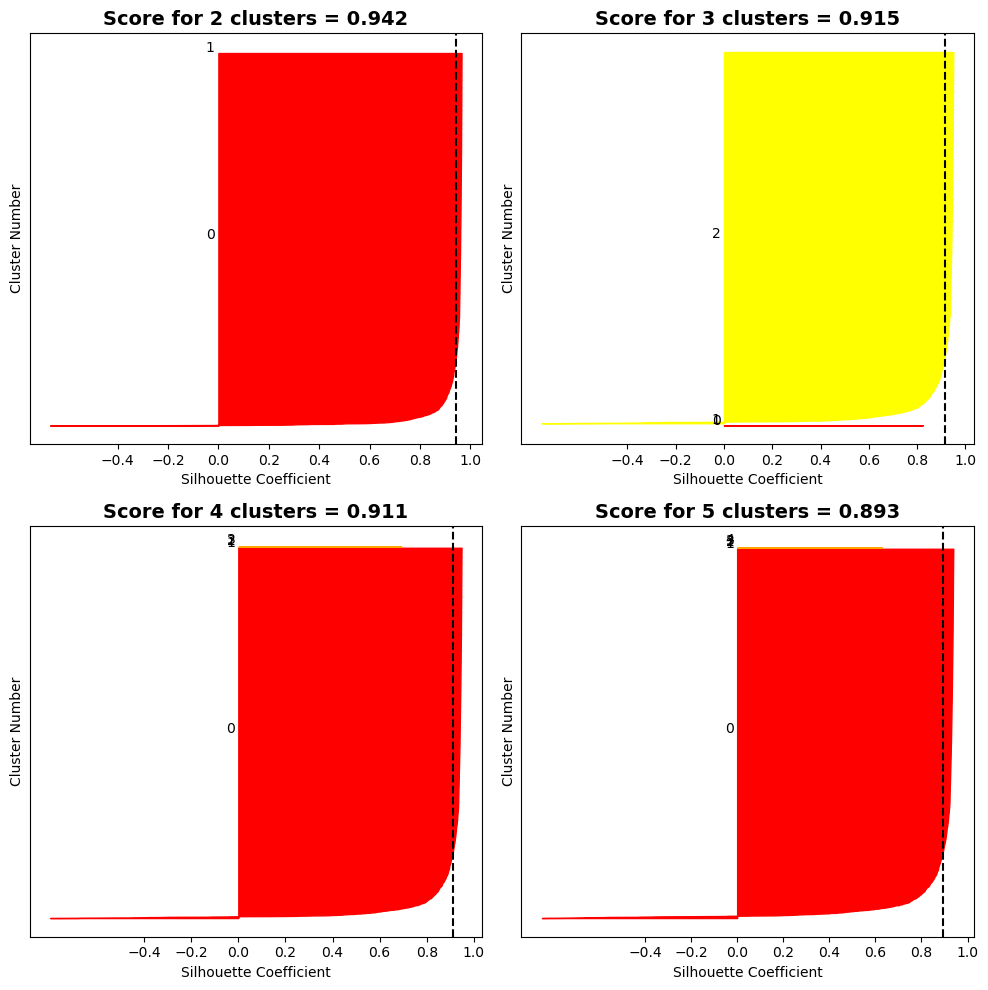

For manhattan metric : 


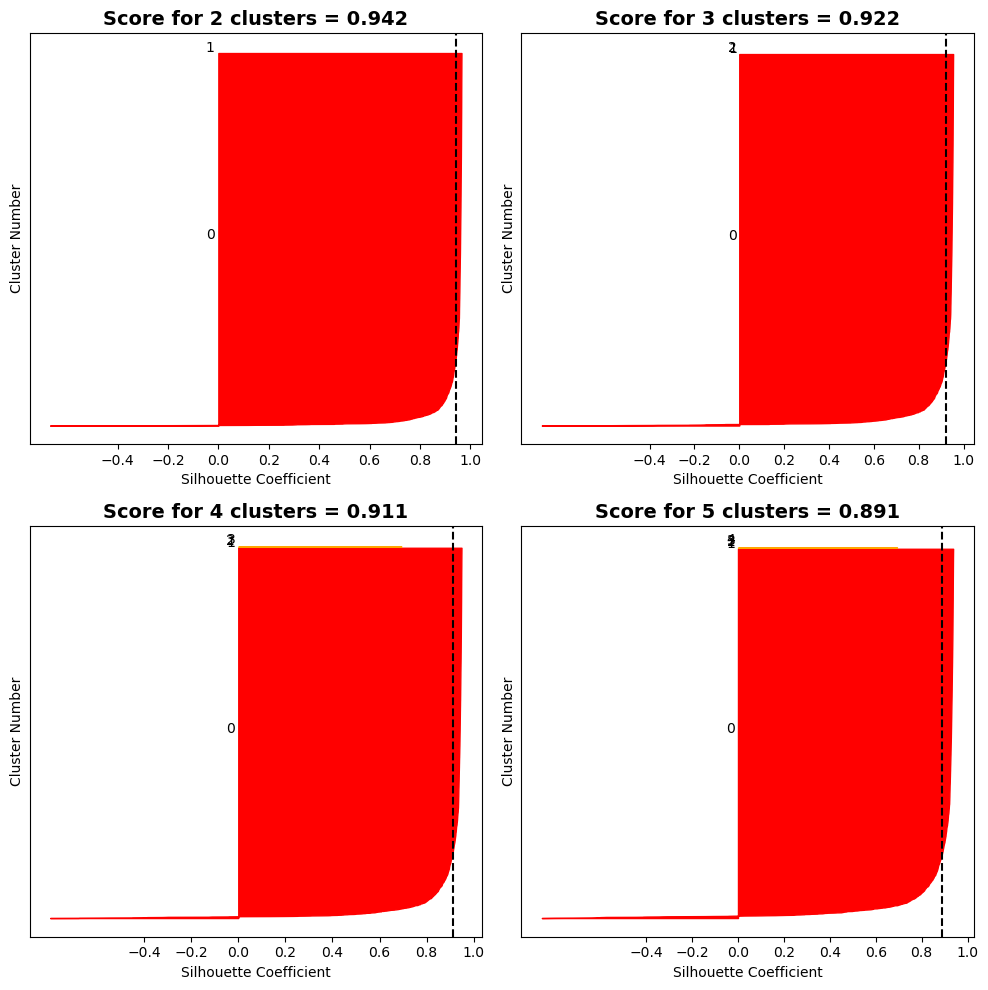

For cosine metric : 


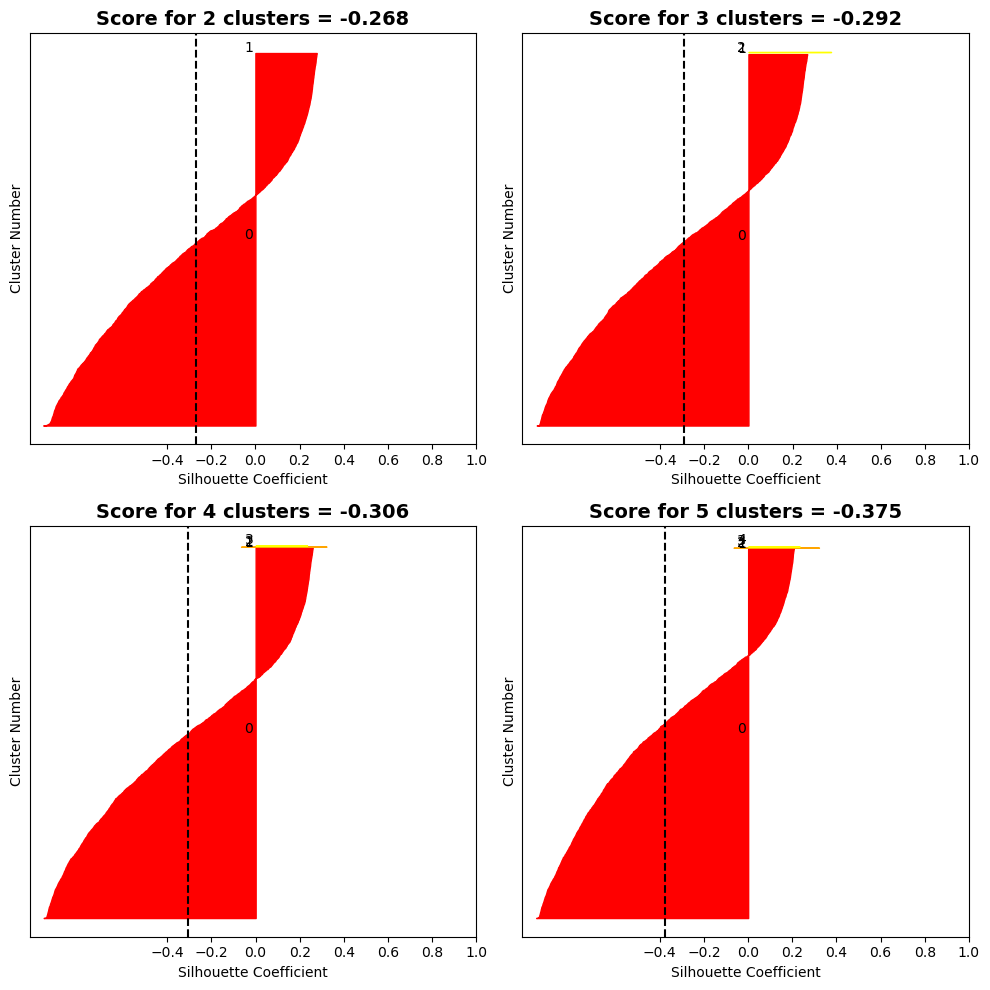

In [21]:
# silplots for single linkage
print('For Single Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'single')

Although the Silhouette Scores are high, most of the data points are limited to only one cluster. Clusters are entirely uneven. Cosine metric is not suitable for this data

For Complete Linkage :
For euclidean metric : 


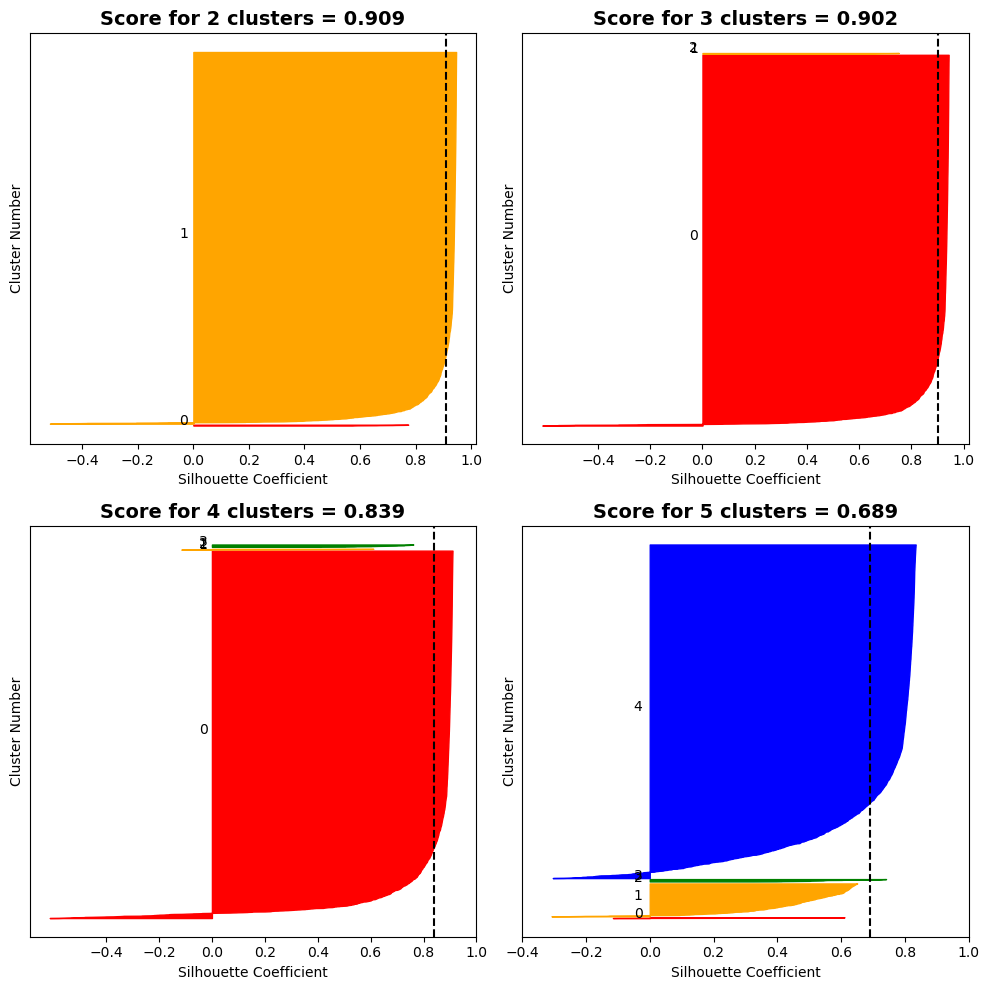

For manhattan metric : 


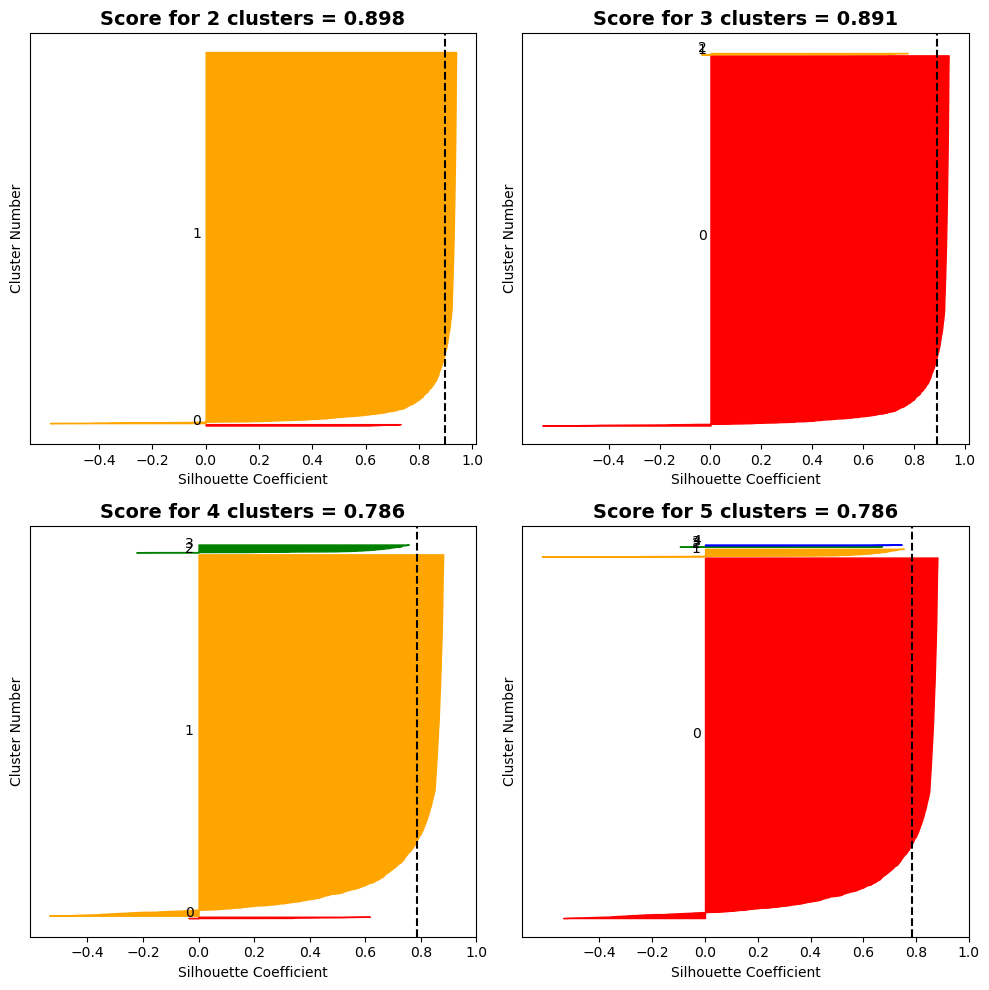

For cosine metric : 


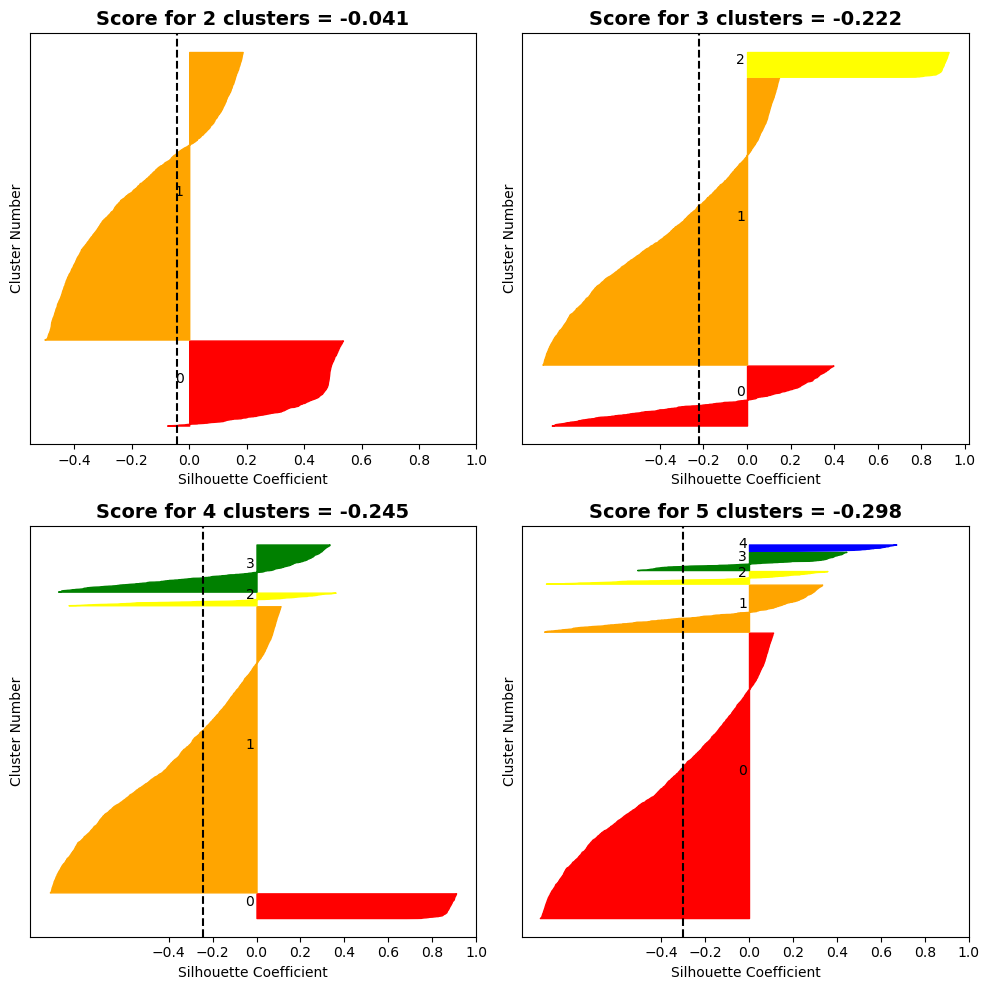

In [22]:
# silplots for complete linkage
print('For Complete Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'complete')

Compelete linkage faces the same issues as single linkage

For Average Linkage :
For euclidean metric : 


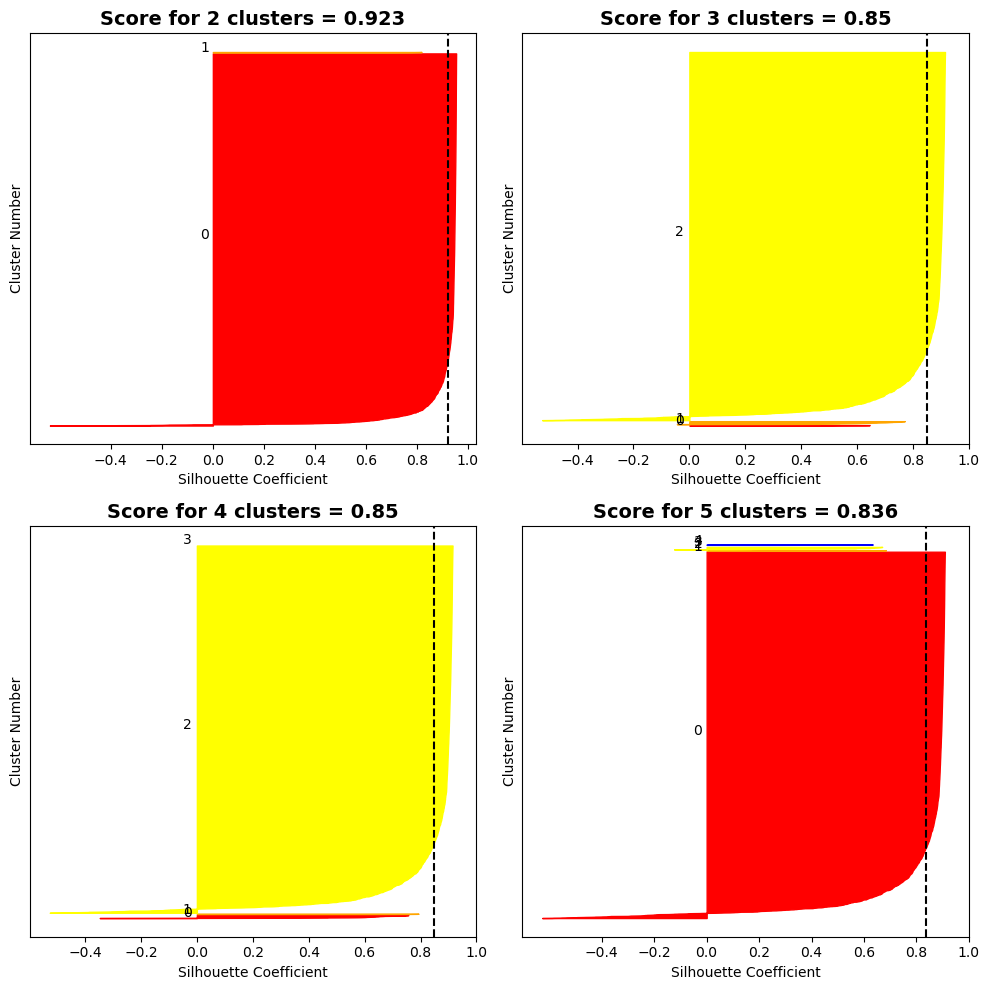

For manhattan metric : 


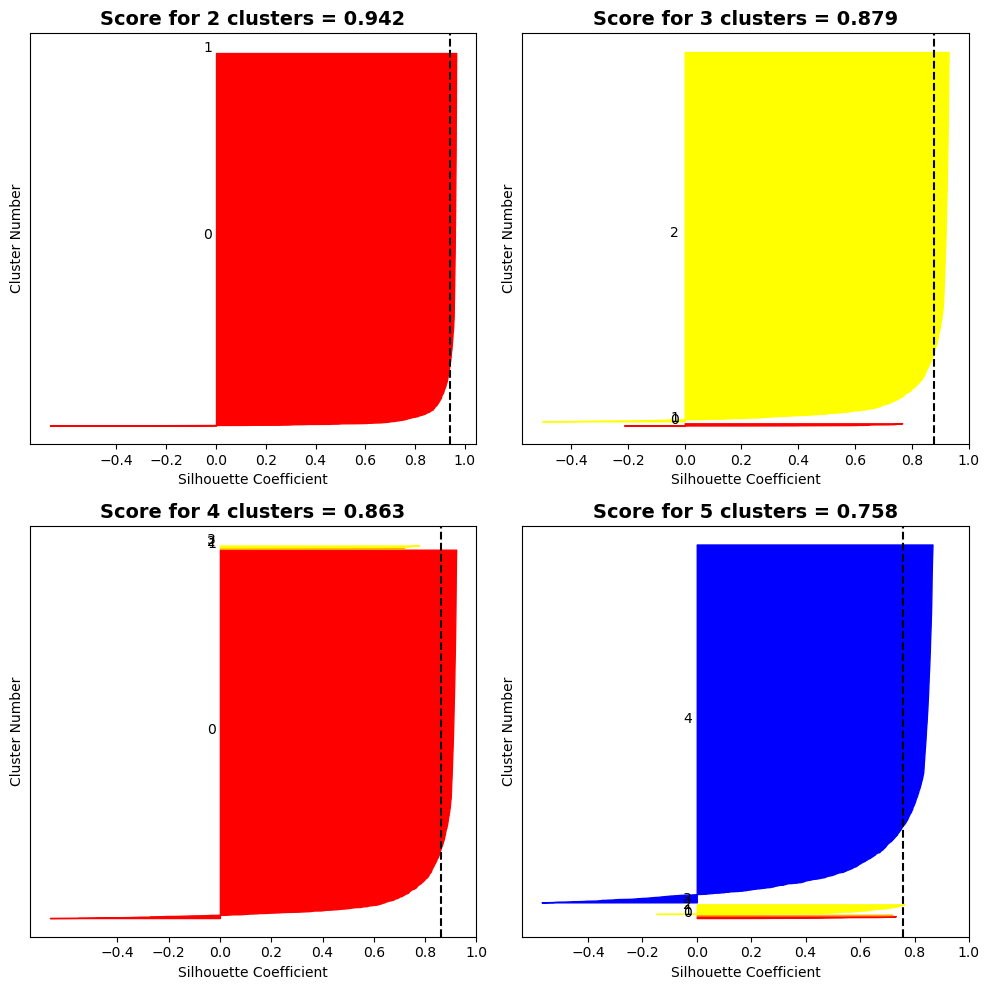

For cosine metric : 


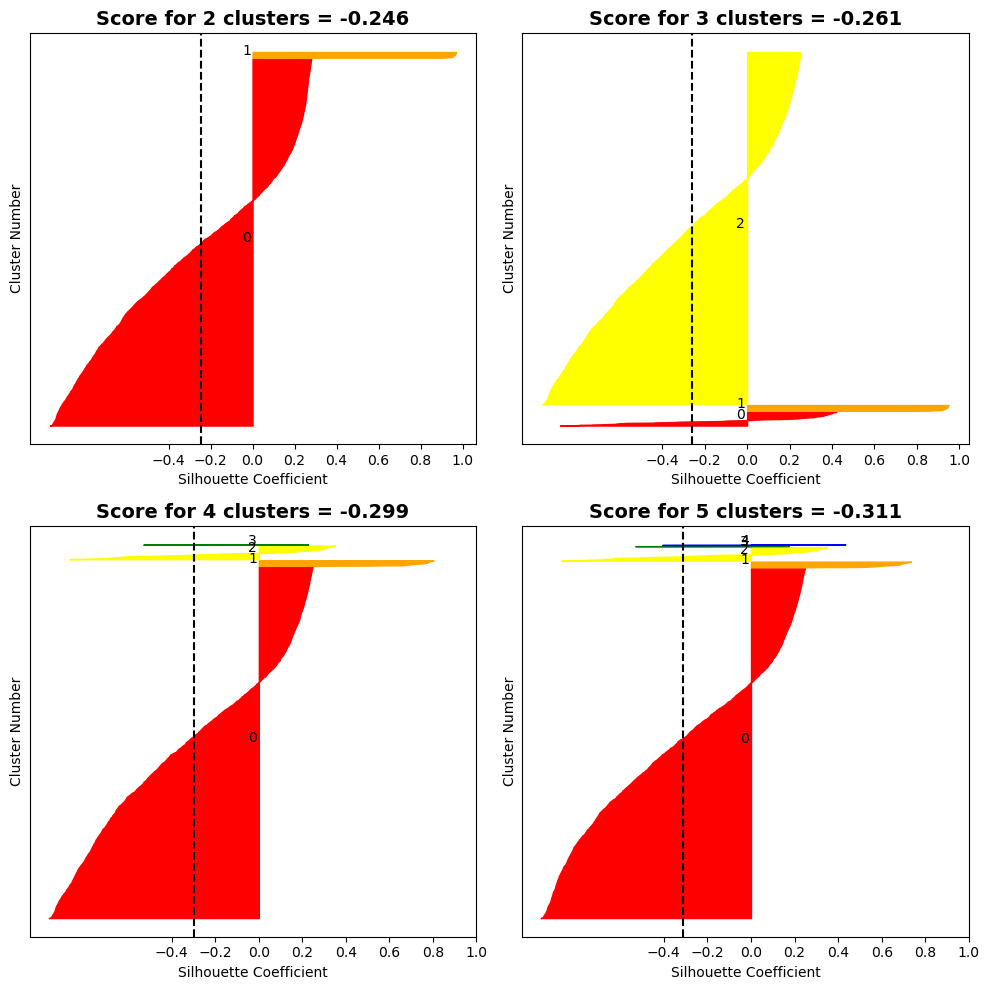

In [23]:
# silplots for average linkage
print('For Average Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'average')

#### While ward linkage, does not limit most data points to just one cluster, it has a high rate of misclustering. Other linkages try to minimize misclustering (except for cosine metric), but end up with most data points in a single cluster, which isn't very helpful.
Under these circumstances, clustering with ward linkage for 2 clusters seem optimum, despite it having lower Silhouette score than other linkages

In [24]:
# Best Agglomerative Clustering for raw data
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(df)
clabel = pd.DataFrame(agg.labels_, columns = ['clabel'])
agg_clustered = pd.concat([df, clabel], axis = 1)
agg_clustered.sort_values(['clabel', 'free_flight'], inplace = True)
agg_clustered['id'] = agg_clustered.index

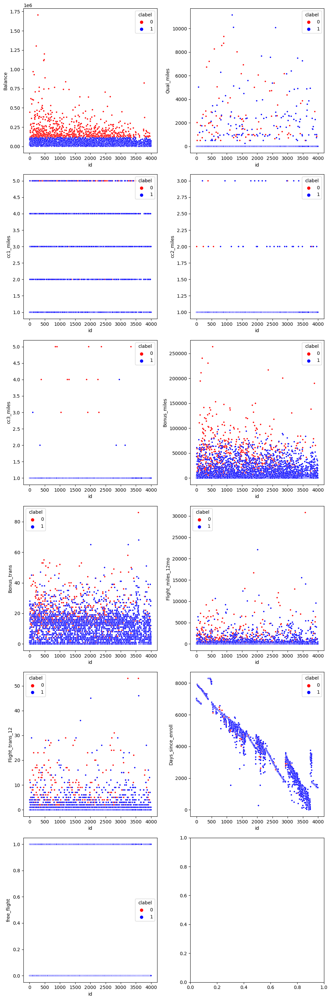

In [25]:
# Visualizing each cluster for each feature
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(agg_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

We seem to have clustered along balance availability

### On standardized data

In [26]:
# Creating a function to display Silhouette plots for 2 to 5 clusters with their Average Silhouette Scores
def silplot(metric = 'euclidean', linkage = 'ward'):
    range_n_clusters = [i for i in range(2,6)]
    cluster_range_size = len(range_n_clusters)
    # creating subplots for each cluster size
    fig, axes = plt.subplots(2, 2, figsize = (10,10))
    # iterating for each cluster size and creating the plot
    ax = [axes[0,0], axes[0,1], axes[1,0], axes[1,1]]
    for i, n_clusters in enumerate(range_n_clusters):
        # applying hierarchical clustering
        clusterer = AgglomerativeClustering(n_clusters=n_clusters, metric = metric, linkage = linkage)
        # getting labels for each sample
        cluster_labels = clusterer.fit_predict(std_df)
        # getting average silhouette score
        silhouette_avg = silhouette_score(std_df, cluster_labels)
        # getting silhouette score for each sample
        sample_silhouette_values = silhouette_samples(std_df, cluster_labels)
        # creating a list of colors to be used for each cluster to differentiate them
        colors = ['red','orange','yellow','green','blue','indigo','violet']
        # setting a gap of 10 from x axis
        y_lower = 10
        # iterating over each cluster and plotting its silhouette's
        for cl in range(n_clusters):
            # getting silhouette values for ith cluster
            clth_cluster_silhouette_values = sample_silhouette_values[cluster_labels == cl]
            # sorting these values for better visualization
            clth_cluster_silhouette_values.sort()
            # getting size of the cluster
            size_cluster_cl = clth_cluster_silhouette_values.shape[0]
            # creating upper bound on y axis for this cluster
            y_upper = y_lower + size_cluster_cl
            # for the defined y values of this cluster, fill color between 0 and the silhouette value of each sample
            ax[i].fill_betweenx(np.arange(y_lower, y_upper),0,clth_cluster_silhouette_values,color=colors[cl])
            # writing the cluster label at the center of each cluster
            ax[i].text(-0.05, y_lower + 0.5 * size_cluster_cl, str(cl))
            # padding by 10 on y axis before starting to plot the next cluster
            y_lower = y_upper + 10
        ax[i].set_xlabel("Silhouette Coefficient")
        ax[i].set_ylabel("Cluster Number")
        ax[i].axvline(x=silhouette_avg, color="black", linestyle="--")
        ax[i].set_yticks([])
        # We do not expect misclustering to be very high, so setting lowest bound on x axis as -0.4 so that all plots match up of the y axis
        ax[i].set_xticks([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
        ax[i].set_title(f"Score for {n_clusters} clusters = {np.round(silhouette_avg, 3)}",fontsize=14,fontweight="bold")
    plt.tight_layout()
    plt.show()

In [27]:
# getting the best average silhouette score

# As ward linkage can only work with euclidean metric, we have to compute it seperately
print("For ward linkage (which works only with euclidean metric): ")
for i in range(2,6):
    agg = AgglomerativeClustering(n_clusters=i)
    agg.fit(std_df)
    print(f"For {i} clusters, Average Silhouette Score is {np.round(silhouette_score(std_df, agg.labels_), 3)}")

For ward linkage (which works only with euclidean metric): 
For 2 clusters, Average Silhouette Score is 0.289
For 3 clusters, Average Silhouette Score is 0.294
For 4 clusters, Average Silhouette Score is 0.308
For 5 clusters, Average Silhouette Score is 0.31


5 clusters gives the best Silhouette Score. Lets plot Silhouette plots for these to get a better understanding of the clusters : 

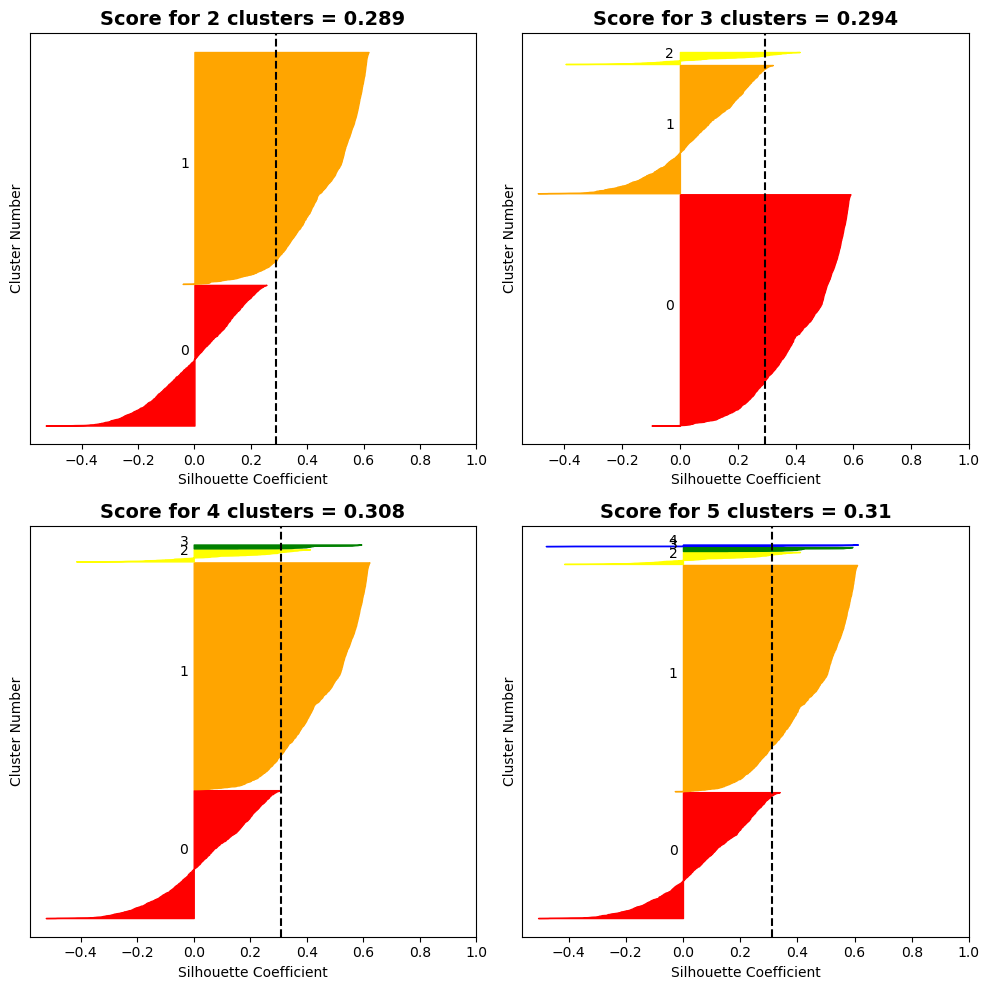

In [28]:
silplot()

All clusters are uneven and include misclustering

In [29]:
# defining different linkages and metrics
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['single', 'average', 'complete']

For Single Linkage :
For euclidean metric : 


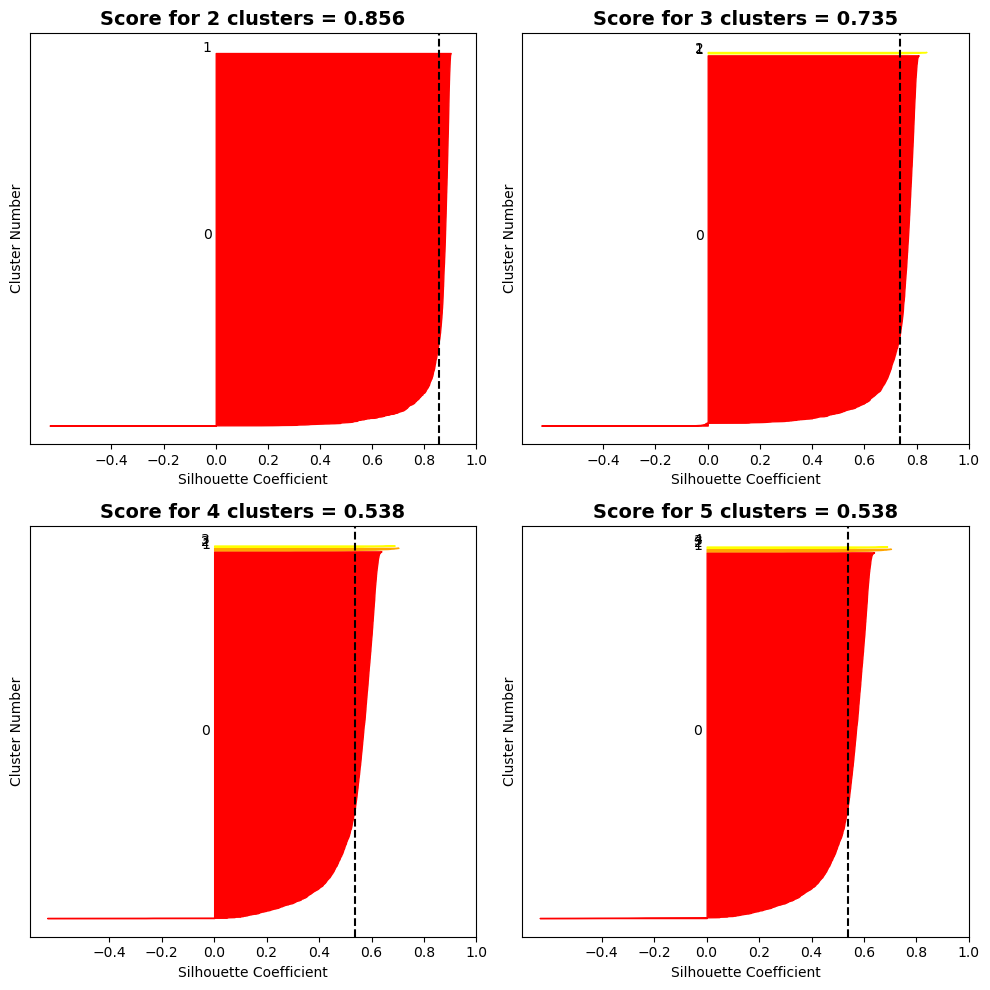

For manhattan metric : 


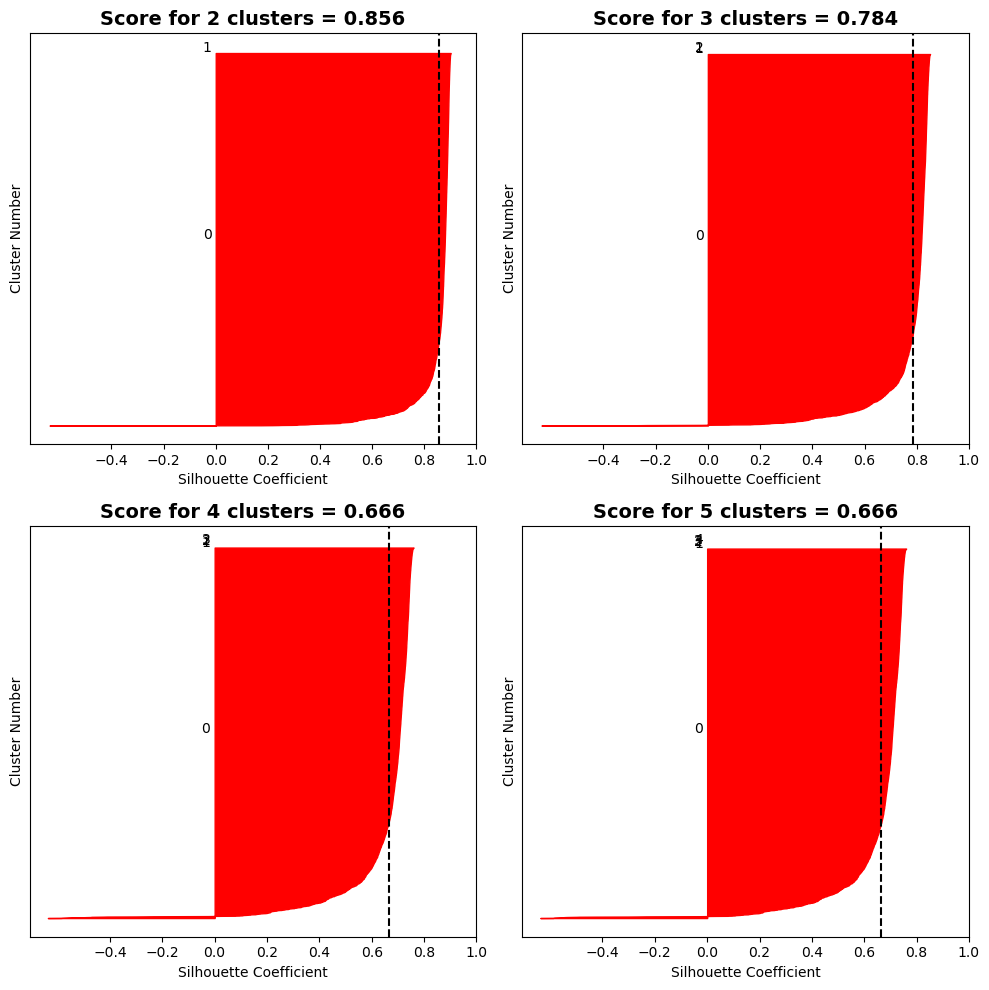

For cosine metric : 


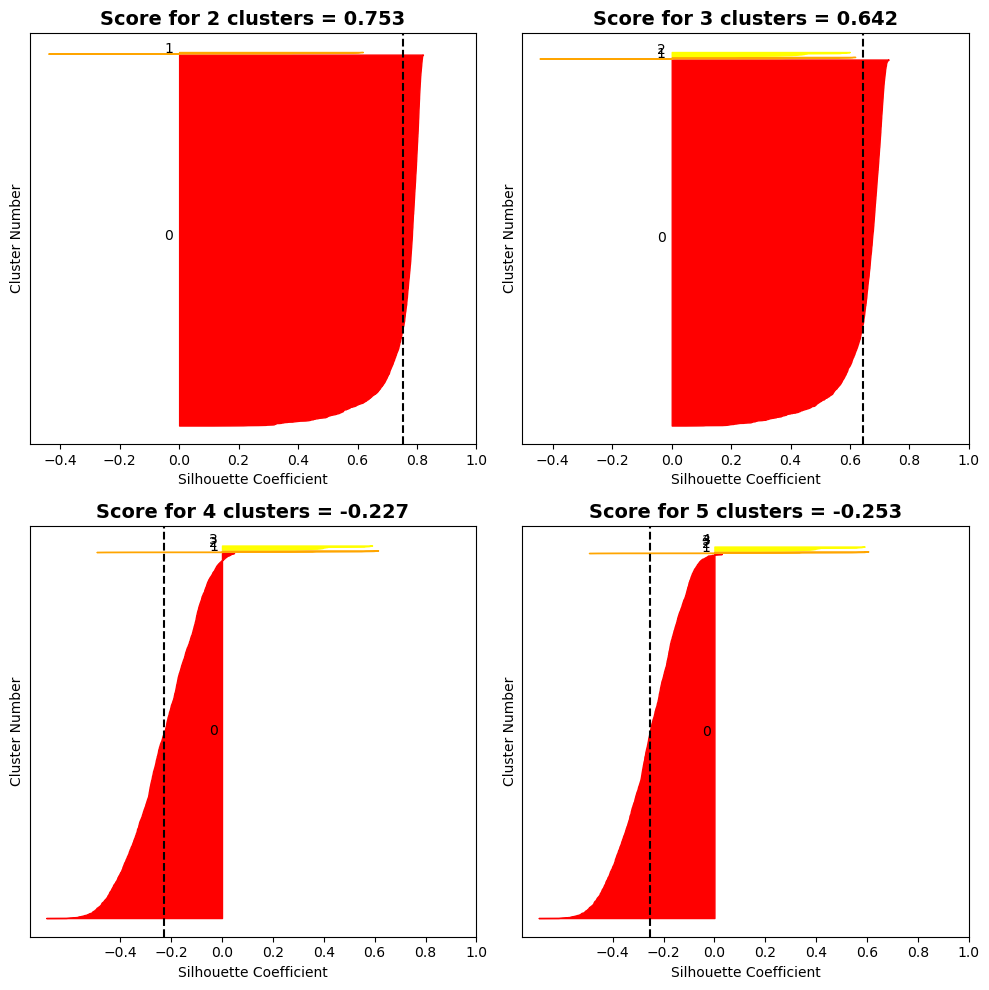

In [30]:
# silplots for single linkage
print('For Single Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'single')

Although the Silhouette Scores are high, most of the data points are limited to only one cluster. Clusters are entirely uneven. Cosine metric is not suitable for this data

For Complete Linkage :
For euclidean metric : 


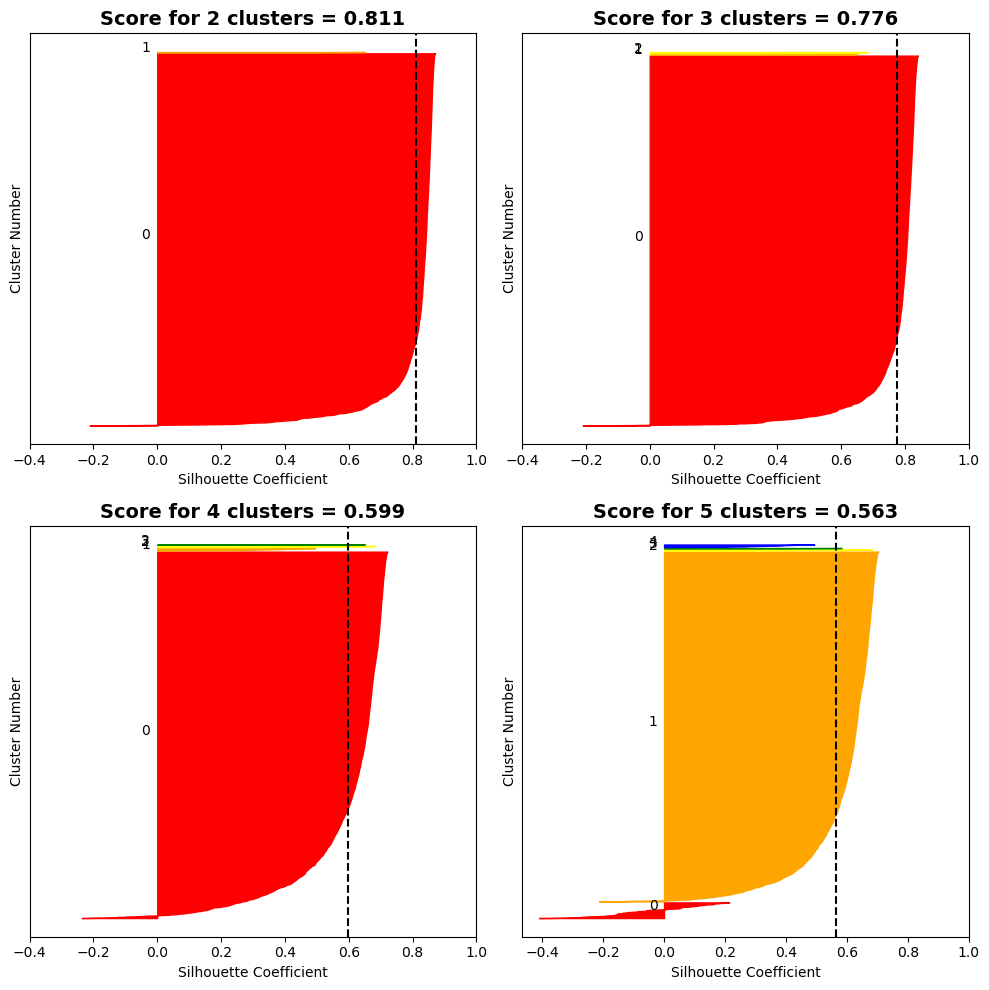

For manhattan metric : 


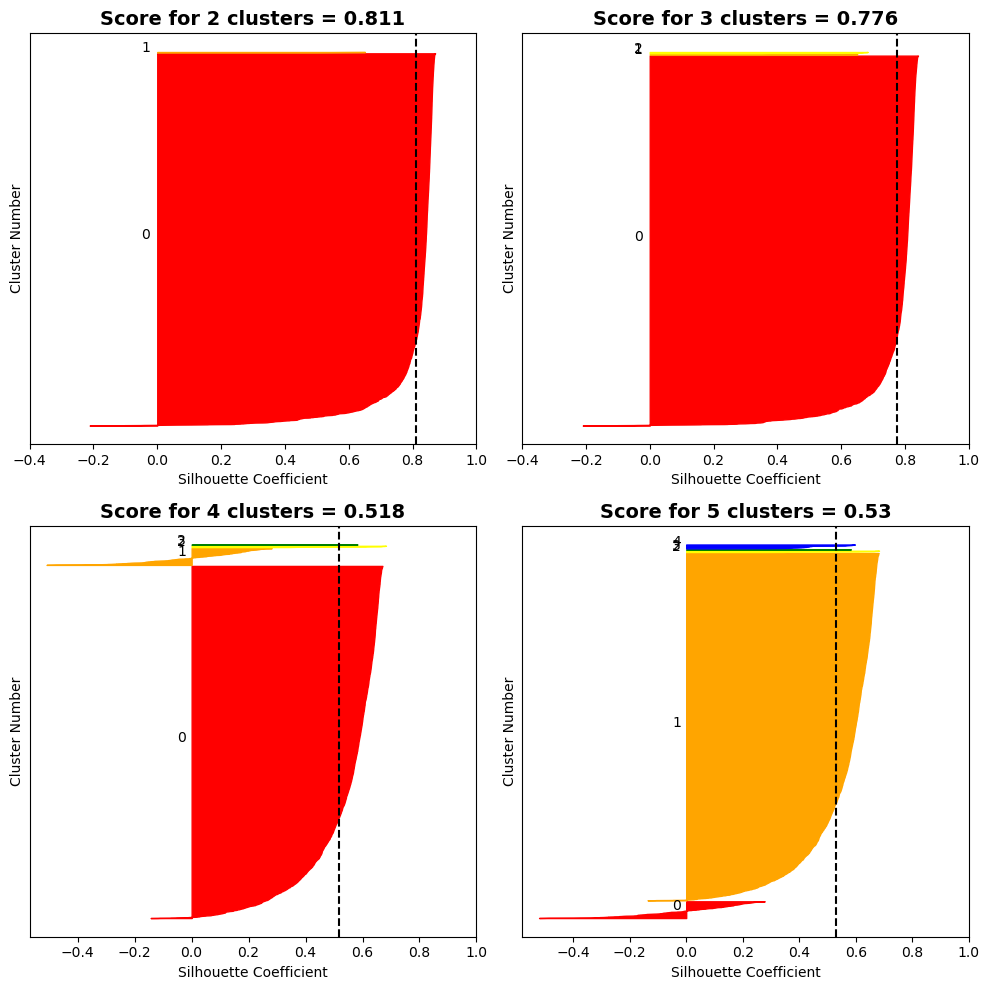

For cosine metric : 


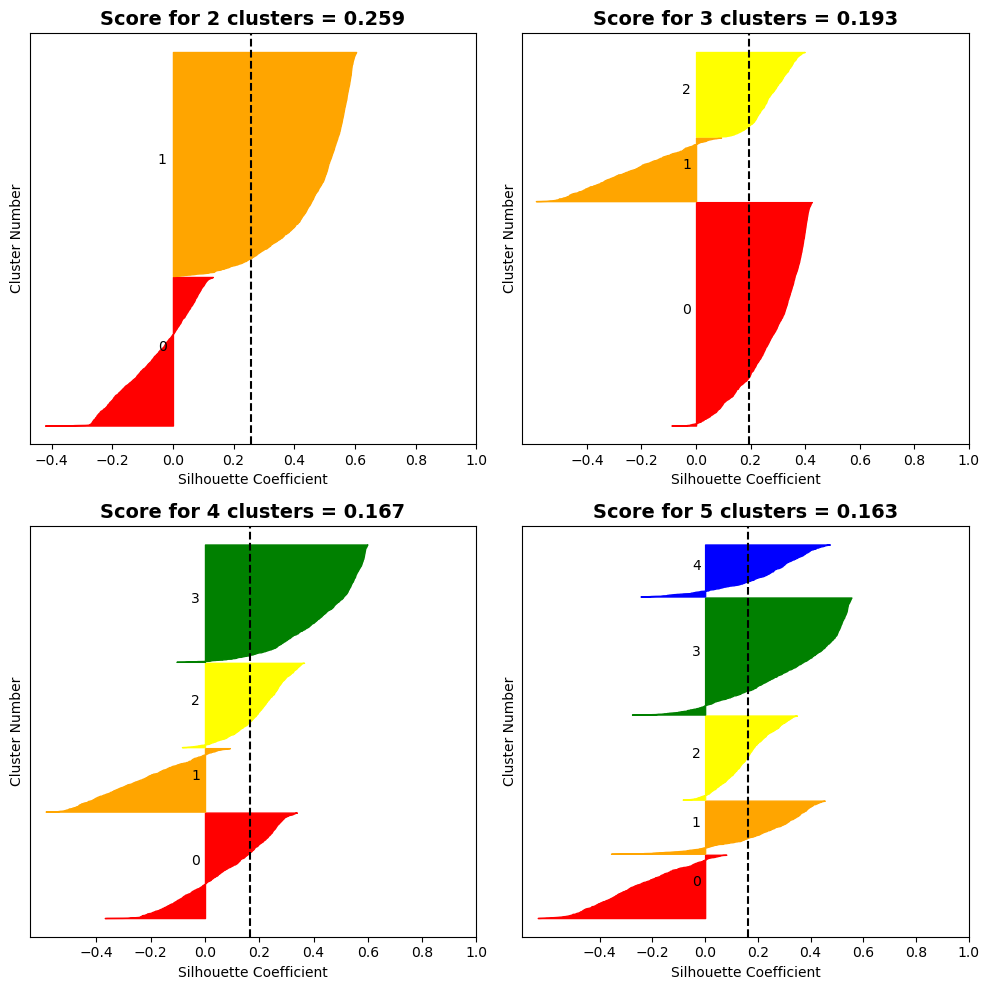

In [31]:
# silplots for complete linkage
print('For Complete Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'complete')

Compelete linkage faces the same issues as single linkage

For Average Linkage :
For euclidean metric : 


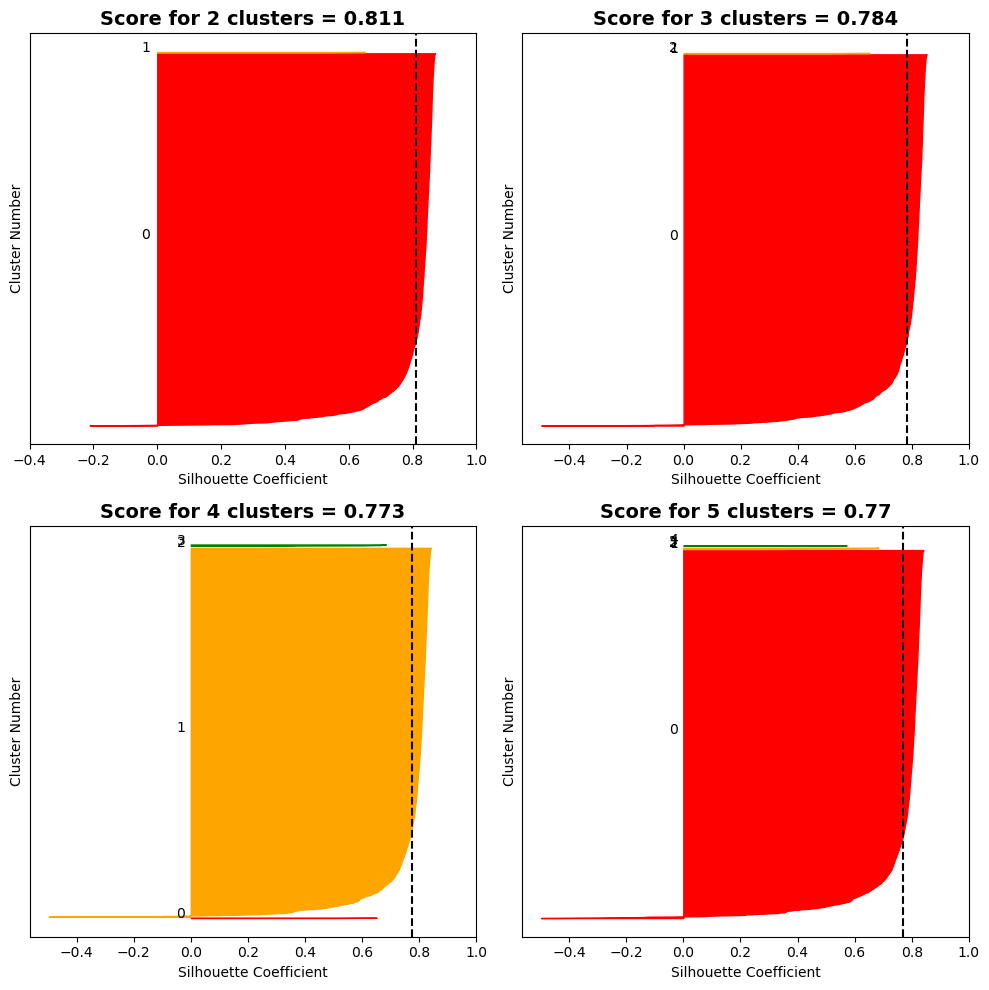

For manhattan metric : 


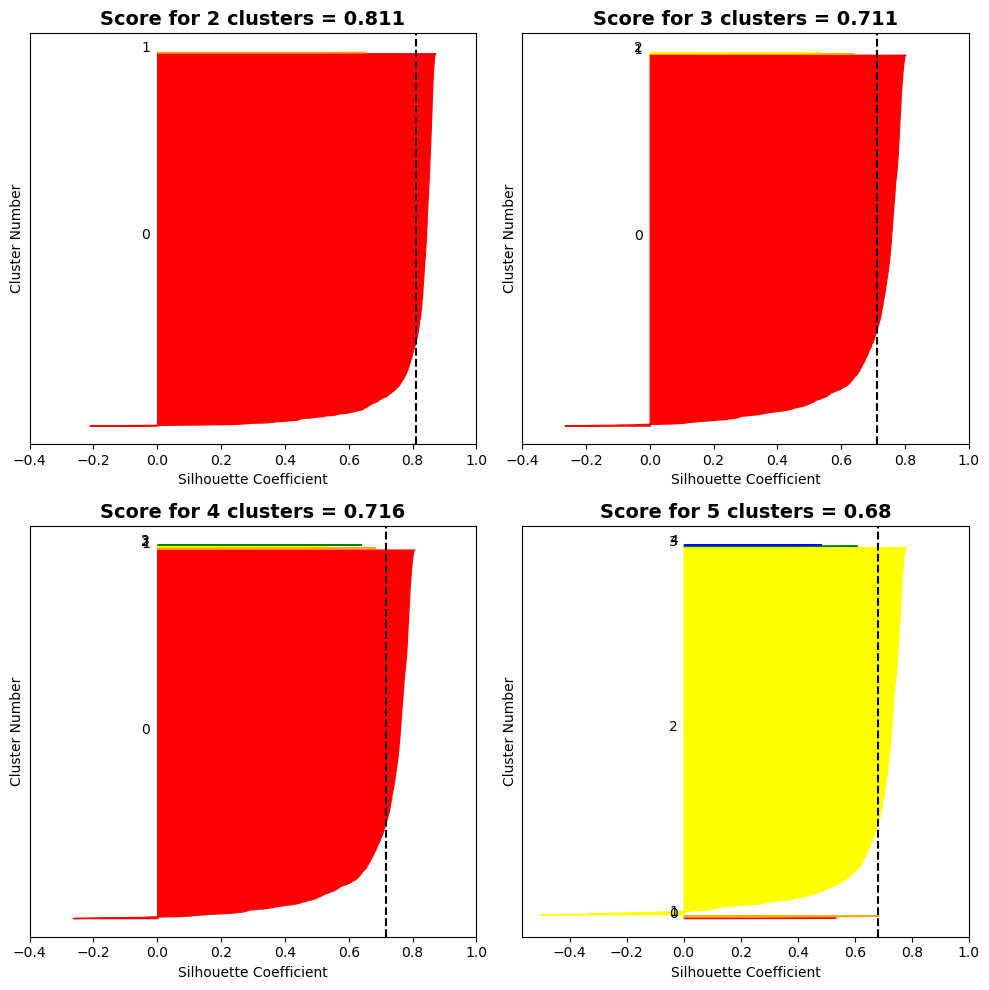

For cosine metric : 


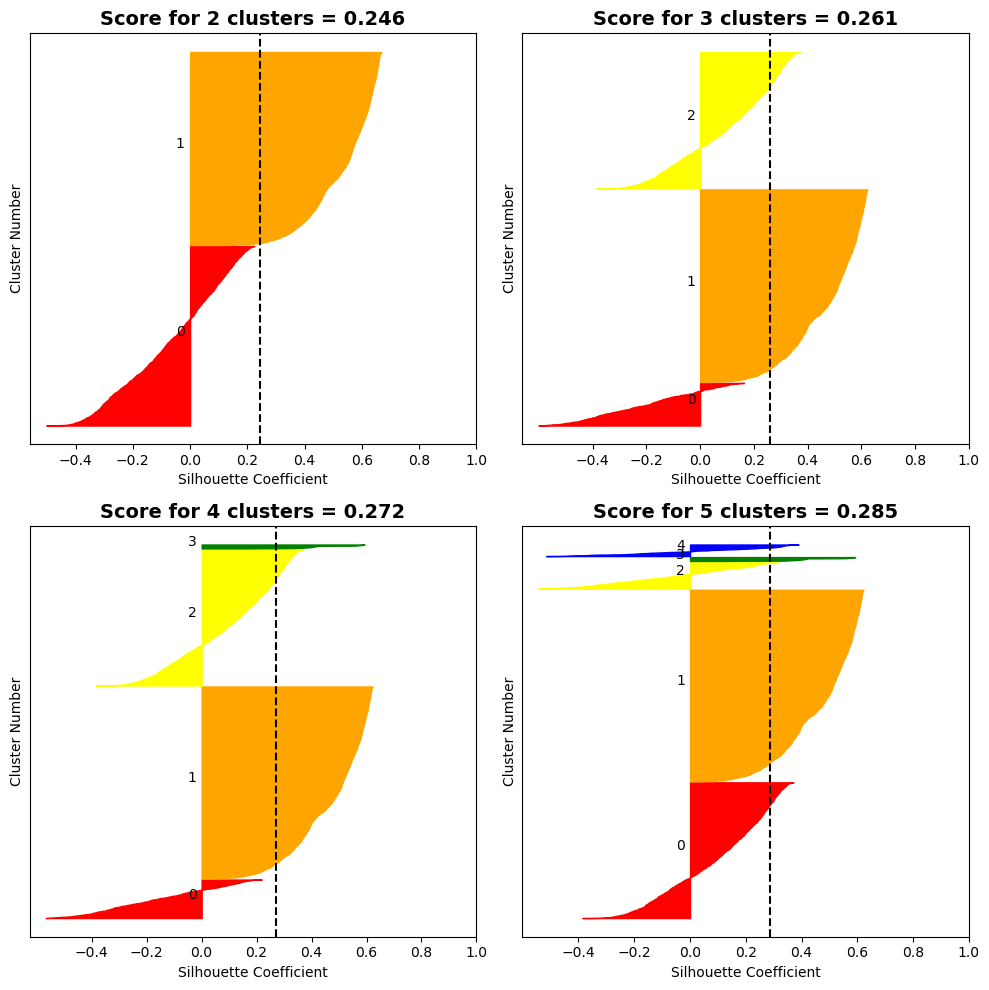

In [32]:
# silplots for average linkage
print('For Average Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'average')

#### While ward linkage, does not limit most data points to just one cluster, it has a high rate of misclustering. Other linkages try to minimize misclustering (except for cosine metric), but end up with most data points in a single cluster, which isn't very helpful.
Under these circumstances, clustering with ward linkage for 2 clusters seem optimum, despite it having lower Silhouette score than other linkages

In [33]:
# Best Agglomerative Clustering for standardized data
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(std_df)
clabel = pd.DataFrame(agg.labels_, columns = ['clabel'])
agg_clustered = pd.concat([std_df, clabel], axis = 1)
agg_clustered.sort_values(['clabel', 'free_flight'], inplace = True)
agg_clustered['id'] = agg_clustered.index

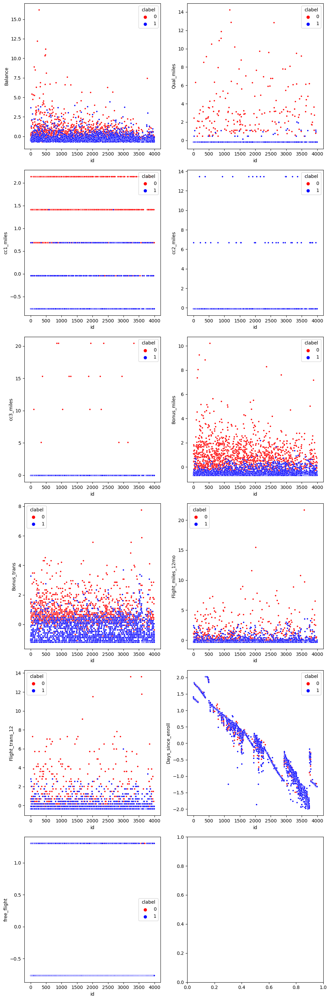

In [34]:
# visualizing cluster for each feature
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(agg_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

We seem to have clustered along Top Flight status

### On normalized data

In [35]:
# Creating a function to display Silhouette plots for 2 to 5 clusters with their Average Silhouette Scores
def silplot(metric = 'euclidean', linkage = 'ward'):
    range_n_clusters = [i for i in range(2,6)]
    cluster_range_size = len(range_n_clusters)
    # creating subplots for each cluster size
    fig, axes = plt.subplots(2, 2, figsize = (10,10))
    # iterating for each cluster size and creating the plot
    ax = [axes[0,0], axes[0,1], axes[1,0], axes[1,1]]
    for i, n_clusters in enumerate(range_n_clusters):
        # applying hierarchical clustering
        clusterer = AgglomerativeClustering(n_clusters=n_clusters, metric = metric, linkage = linkage)
        # getting labels for each sample
        cluster_labels = clusterer.fit_predict(norm_df)
        # getting average silhouette score
        silhouette_avg = silhouette_score(norm_df, cluster_labels)
        # getting silhouette score for each sample
        sample_silhouette_values = silhouette_samples(norm_df, cluster_labels)
        # creating a list of colors to be used for each cluster to differentiate them
        colors = ['red','orange','yellow','green','blue','indigo','violet']
        # setting a gap of 10 from x axis
        y_lower = 10
        # iterating over each cluster and plotting its silhouette's
        for cl in range(n_clusters):
            # getting silhouette values for ith cluster
            clth_cluster_silhouette_values = sample_silhouette_values[cluster_labels == cl]
            # sorting these values for better visualization
            clth_cluster_silhouette_values.sort()
            # getting size of the cluster
            size_cluster_cl = clth_cluster_silhouette_values.shape[0]
            # creating upper bound on y axis for this cluster
            y_upper = y_lower + size_cluster_cl
            # for the defined y values of this cluster, fill color between 0 and the silhouette value of each sample
            ax[i].fill_betweenx(np.arange(y_lower, y_upper),0,clth_cluster_silhouette_values,color=colors[cl])
            # writing the cluster label at the center of each cluster
            ax[i].text(-0.05, y_lower + 0.5 * size_cluster_cl, str(cl))
            # padding by 10 on y axis before starting to plot the next cluster
            y_lower = y_upper + 10
        ax[i].set_xlabel("Silhouette Coefficient")
        ax[i].set_ylabel("Cluster Number")
        ax[i].axvline(x=silhouette_avg, color="black", linestyle="--")
        ax[i].set_yticks([])
        # We do not expect misclustering to be very high, so setting lowest bound on x axis as -0.4 so that all plots match up of the y axis
        ax[i].set_xticks([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
        ax[i].set_title(f"Score for {n_clusters} clusters = {np.round(silhouette_avg, 3)}",fontsize=14,fontweight="bold")
    plt.tight_layout()
    plt.show()

In [36]:
# getting the best average silhouette score

# As ward linkage can only work with euclidean metric, we have to compute it seperately
print("For ward linkage (which works only with euclidean metric): ")
for i in range(2,6):
    agg = AgglomerativeClustering(n_clusters=i)
    agg.fit(norm_df)
    print(f"For {i} clusters, Average Silhouette Score is {np.round(silhouette_score(norm_df, agg.labels_), 3)}")

For ward linkage (which works only with euclidean metric): 
For 2 clusters, Average Silhouette Score is 0.536
For 3 clusters, Average Silhouette Score is 0.436
For 4 clusters, Average Silhouette Score is 0.425
For 5 clusters, Average Silhouette Score is 0.376


2 clusters gives the best Silhouette Score. Lets plot Silhouette plots for these to get a better understanding of the clusters : 

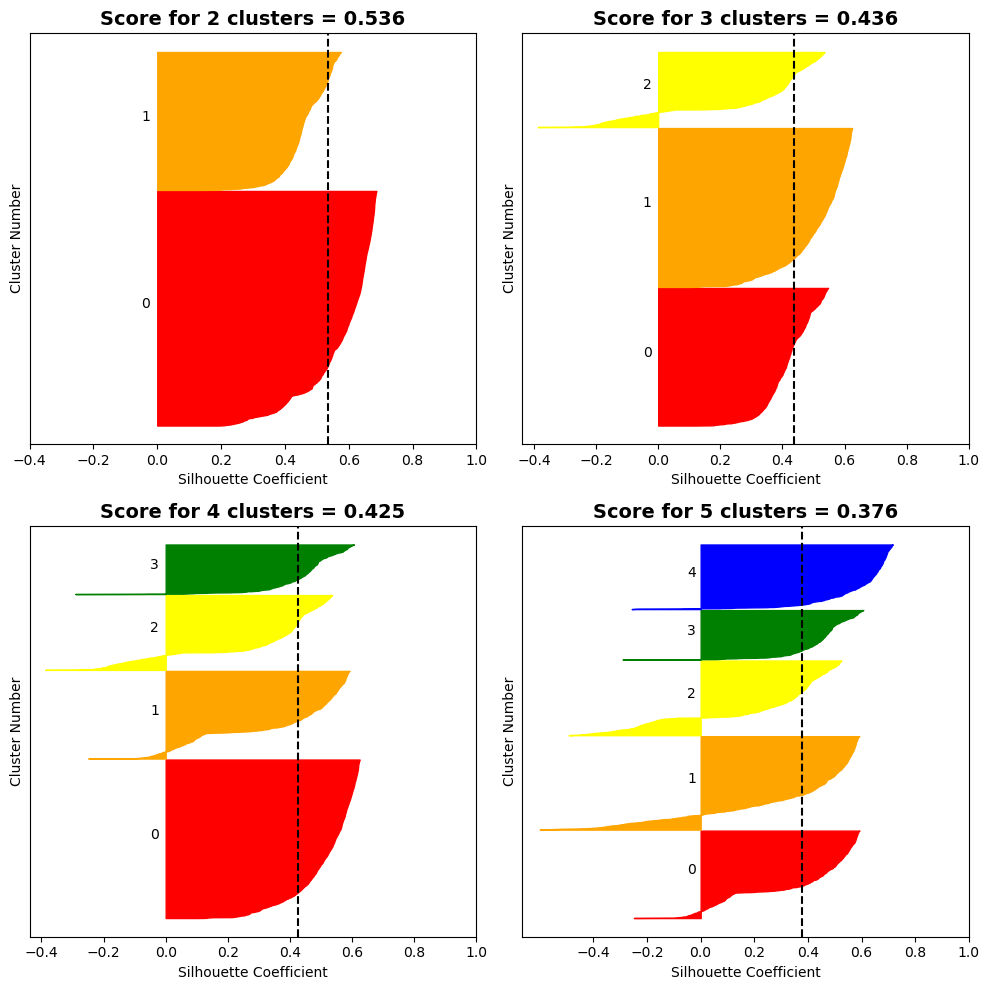

In [37]:
silplot()

All clusters are even but only 2 custers don't have misclustering

In [38]:
# defining different linkages and metrics
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['single', 'average', 'complete']

For Single Linkage :
For euclidean metric : 


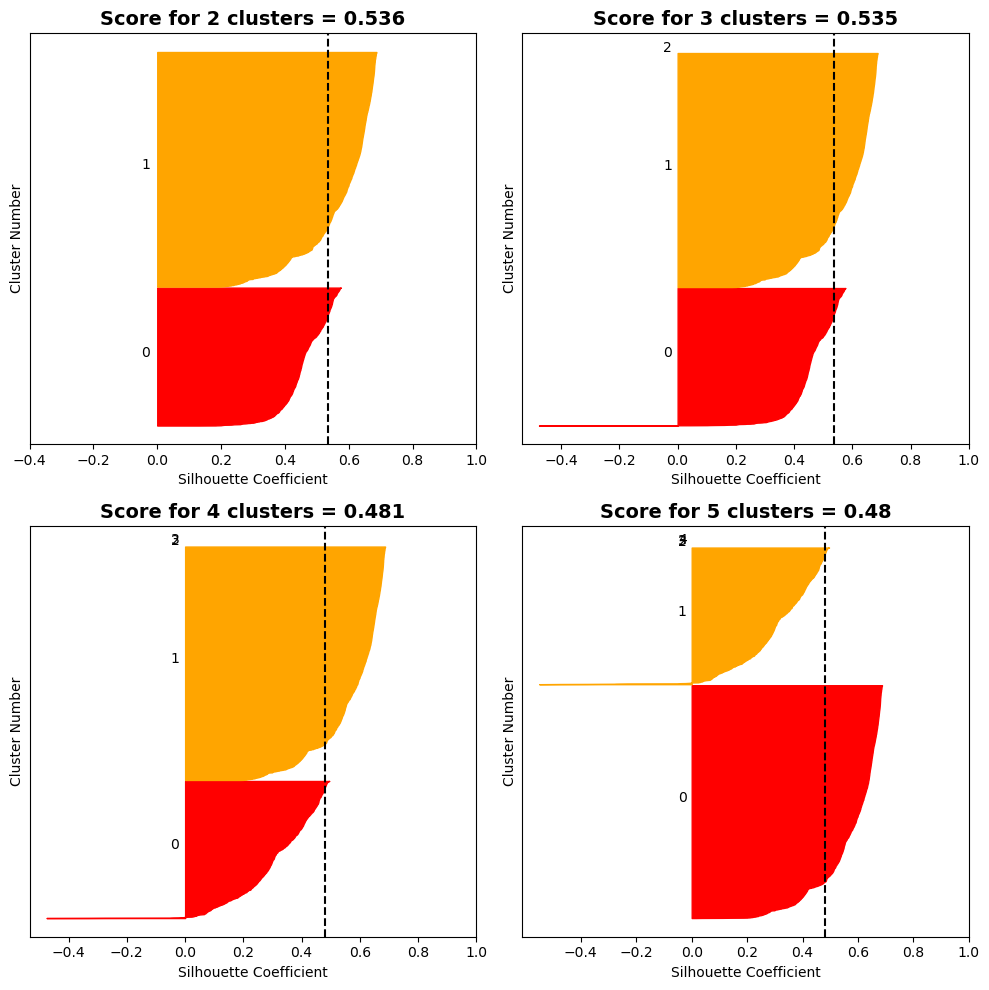

For manhattan metric : 


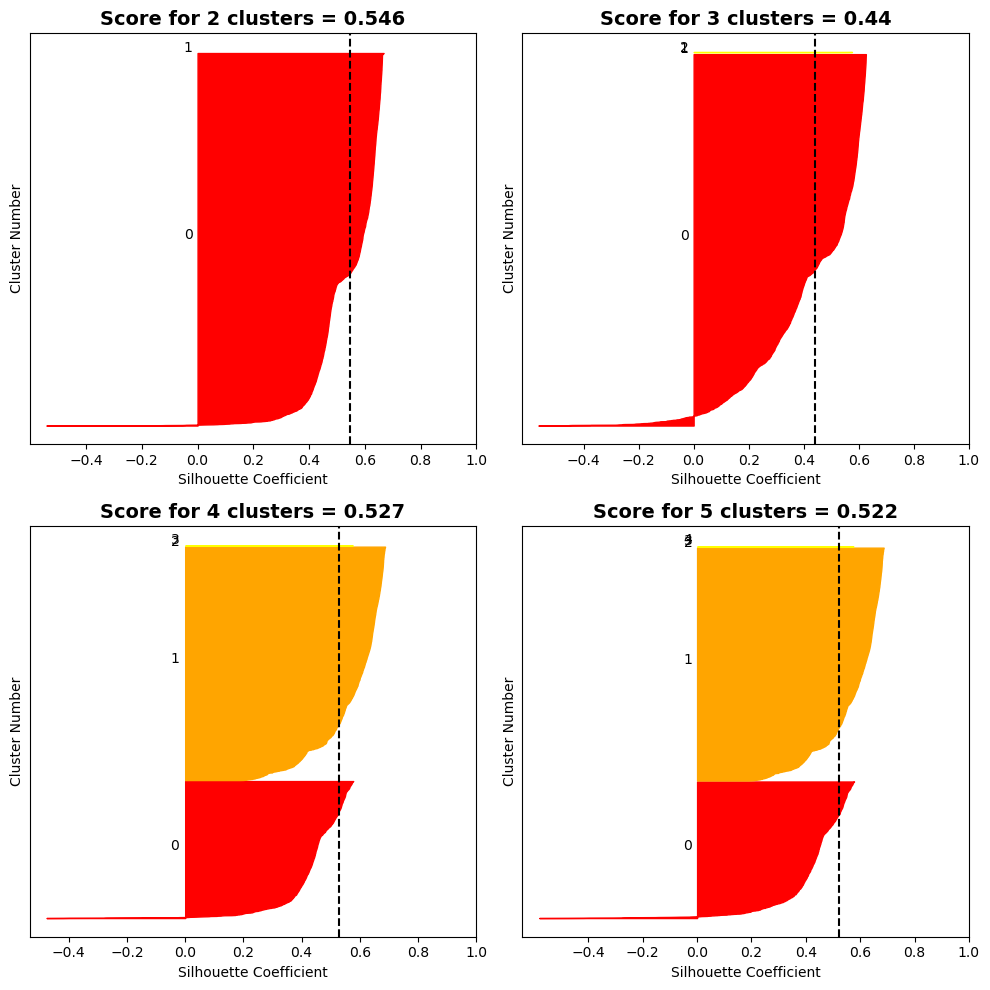

For cosine metric : 


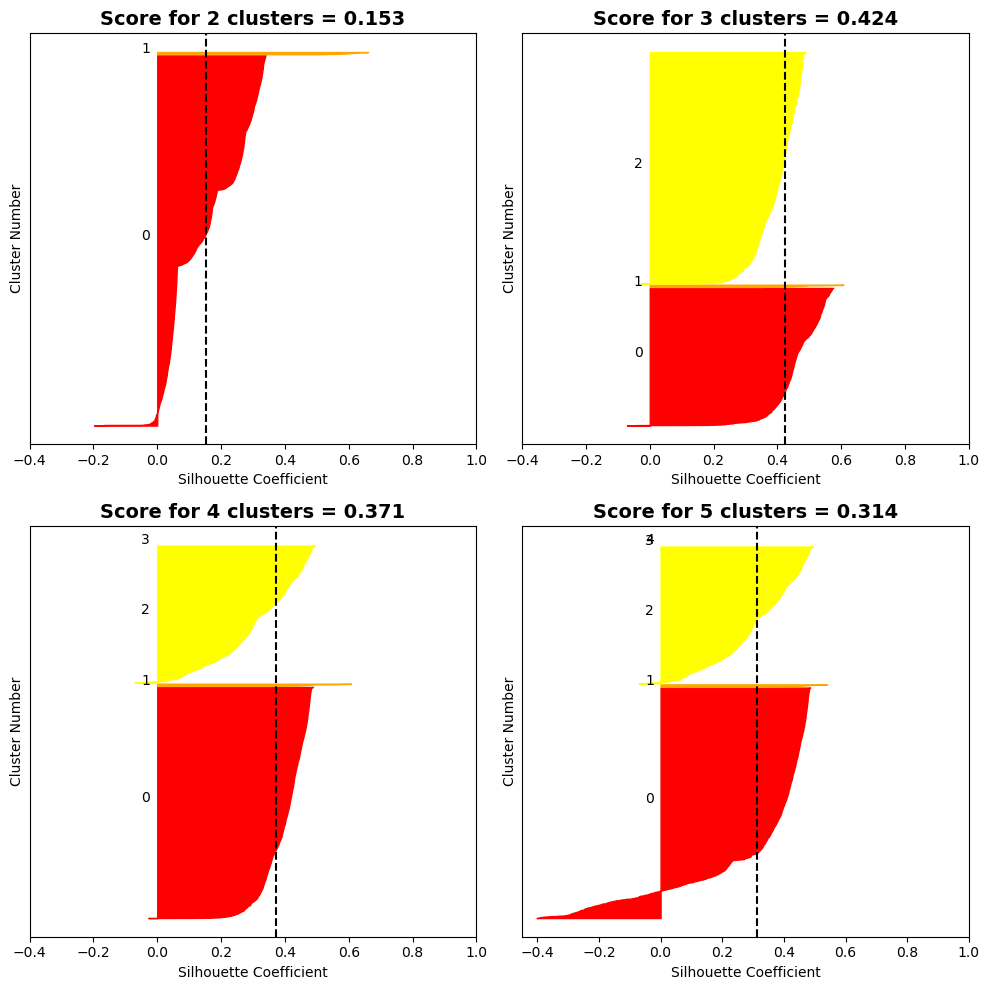

In [39]:
# silplots for single linkage
print('For Single Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'single')

2 cluster has the best score and even clustering, with no misclustering

For Complete Linkage :
For euclidean metric : 


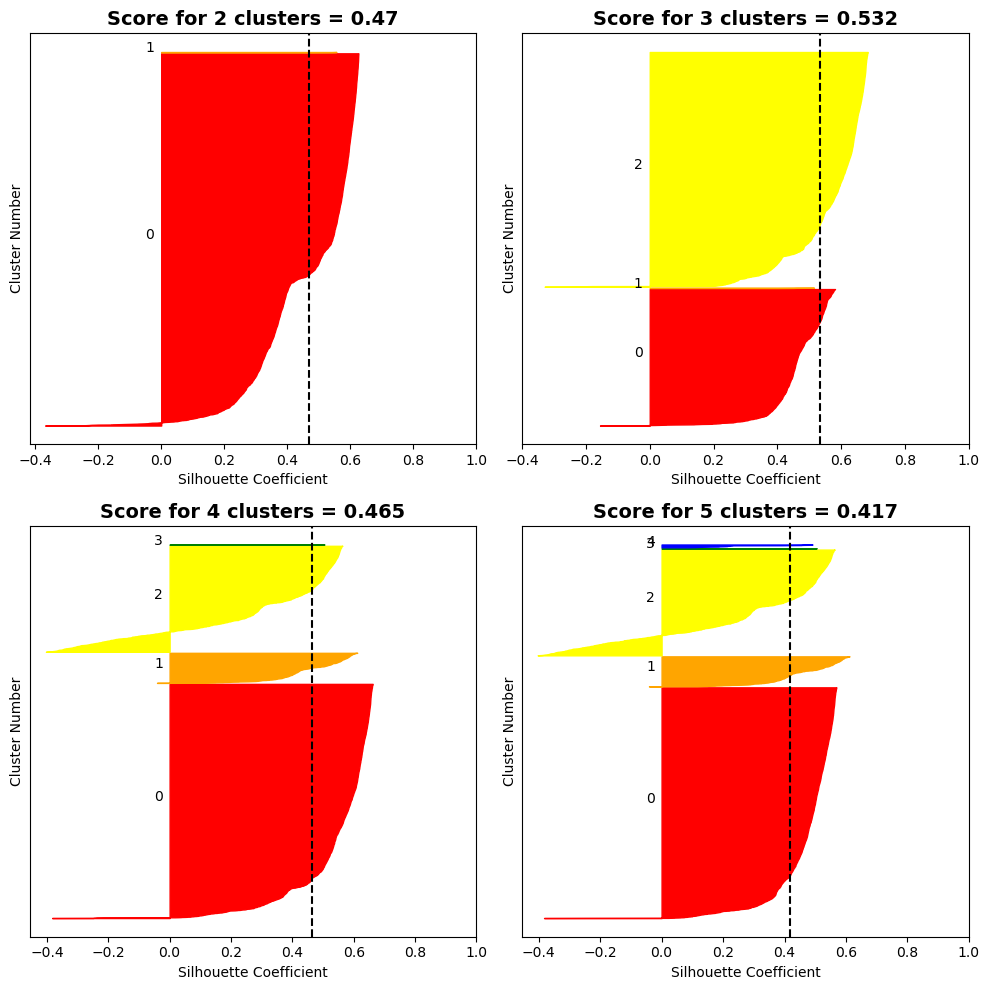

For manhattan metric : 


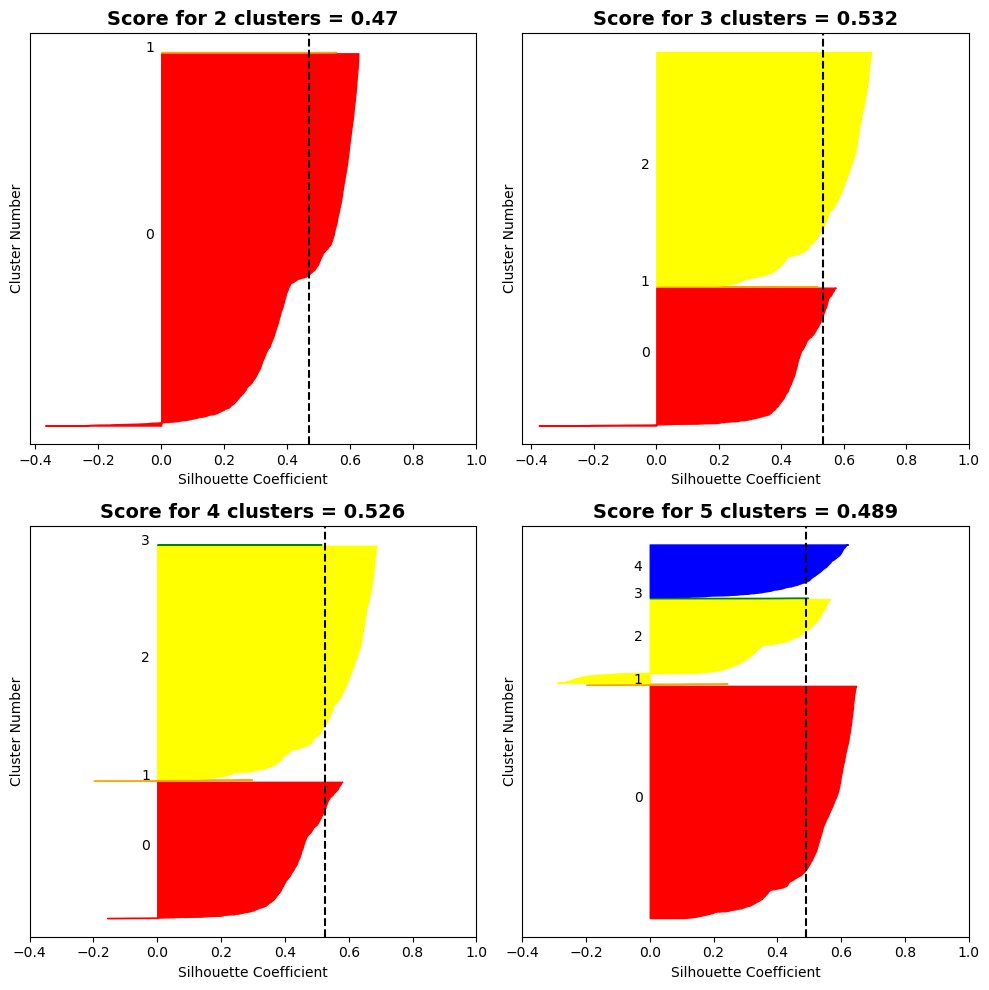

For cosine metric : 


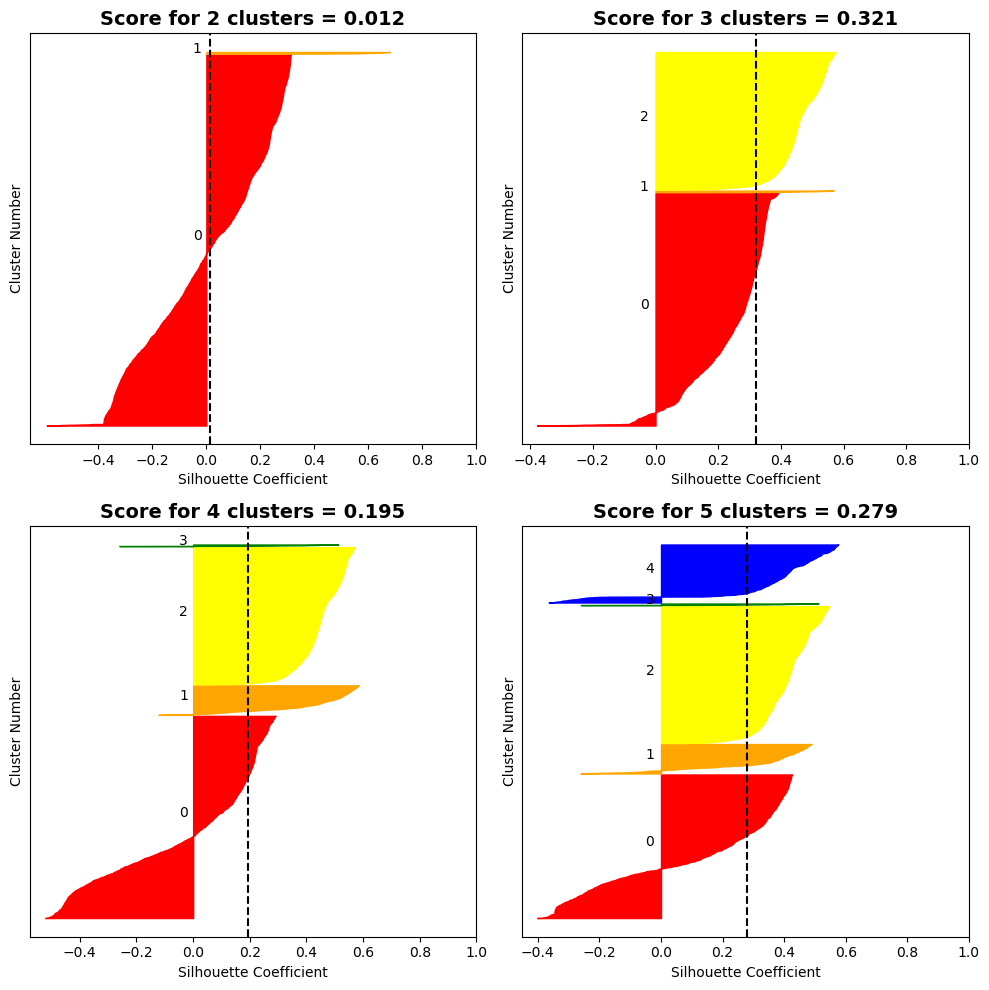

In [40]:
# silplots for complete linkage
print('For Complete Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'complete')

Clusters are uneven and there is a lot of misclustering

For Average Linkage :
For euclidean metric : 


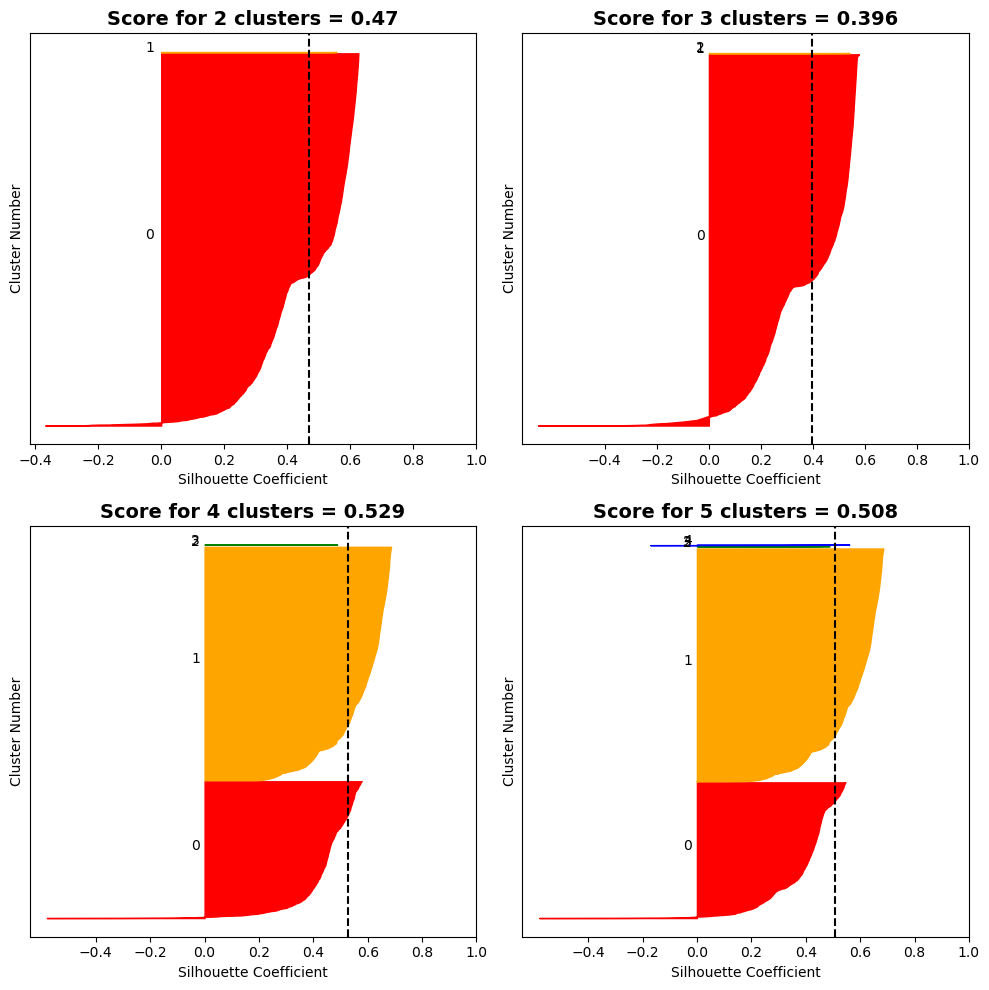

For manhattan metric : 


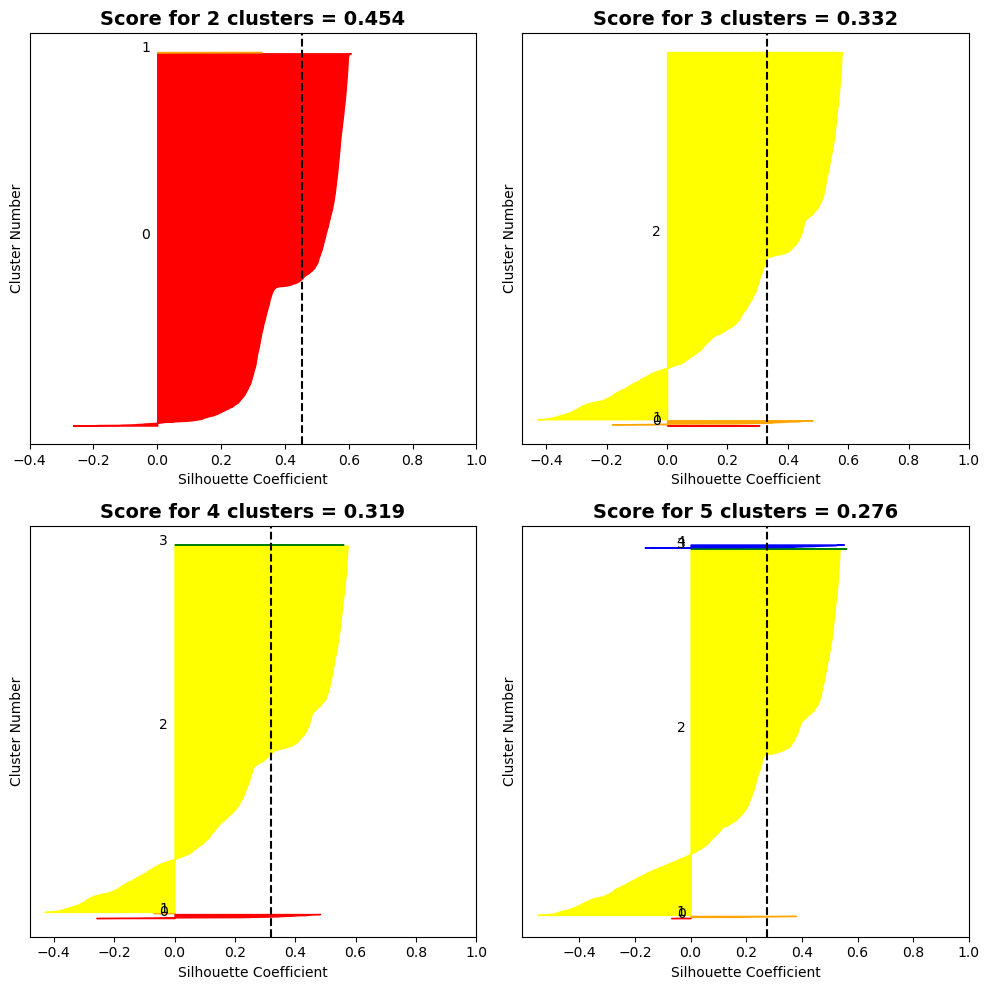

For cosine metric : 


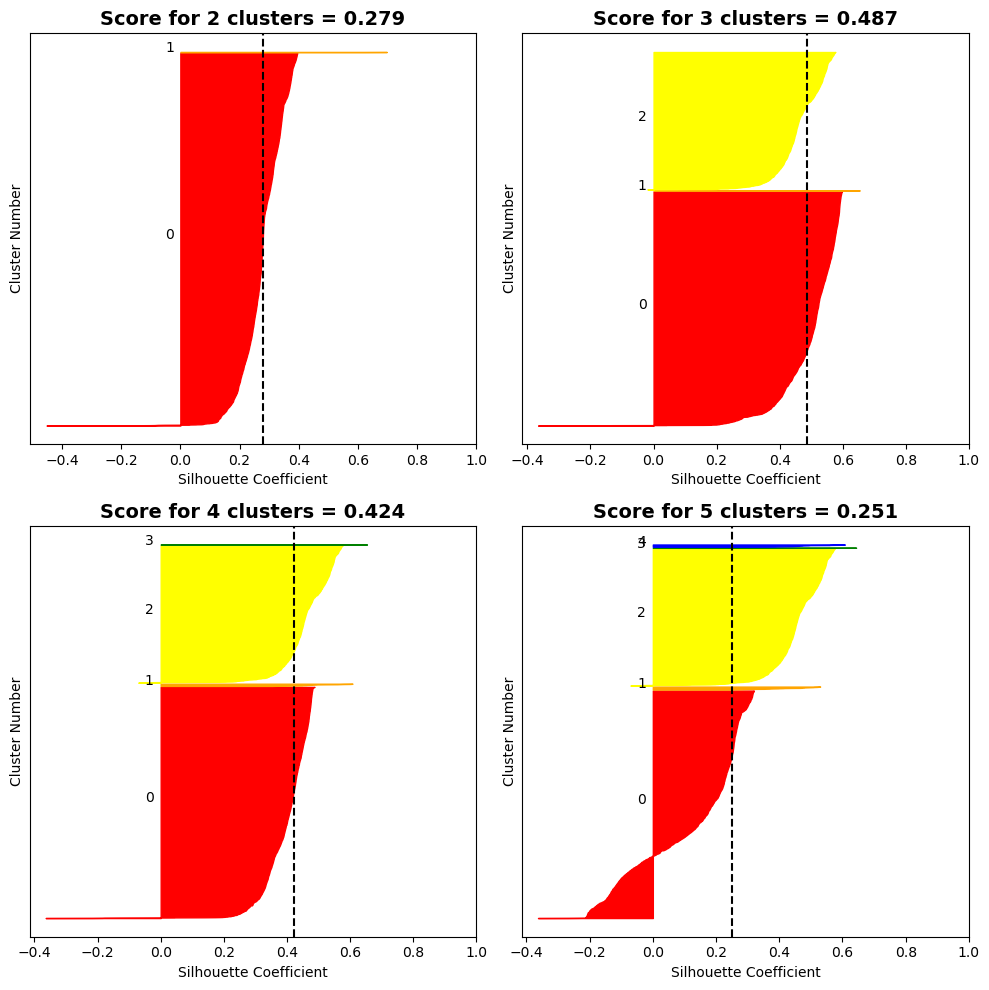

In [41]:
# silplots for average linkage
print('For Average Linkage :')
for metric in metrics:
    print(f"For {metric} metric : ")
    silplot(metric = metric, linkage = 'average')

#### Ward and Single linkage for 2 clusters with euclidean distance metric have the best scores considering no misclustering and even clusters

##### Best clustering with Ward Linkage

In [42]:
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(norm_df)
clabel = pd.DataFrame(agg.labels_, columns = ['clabel'])
agg_clustered = pd.concat([norm_df, clabel], axis = 1)
agg_clustered.sort_values(['clabel', 'free_flight'], inplace = True)
agg_clustered['id'] = agg_clustered.index

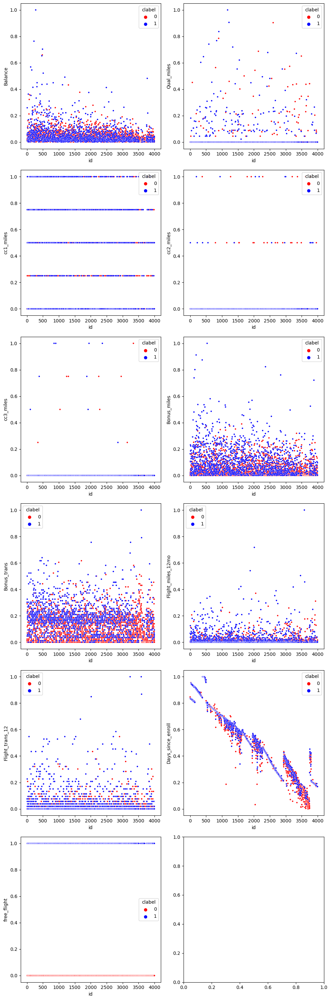

In [43]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(agg_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

It is unclear what the clustering is based on

##### Best clustering with Single Linkage

In [44]:
agg = AgglomerativeClustering(n_clusters=2, linkage='single')
agg.fit(norm_df)
clabel = pd.DataFrame(agg.labels_, columns = ['clabel'])
agg_clustered = pd.concat([norm_df, clabel], axis = 1)
agg_clustered.sort_values(['clabel', 'free_flight'], inplace = True)
agg_clustered['id'] = agg_clustered.index

In [45]:
agg_clustered.columns

Index(['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight', 'clabel', 'id'],
      dtype='object')

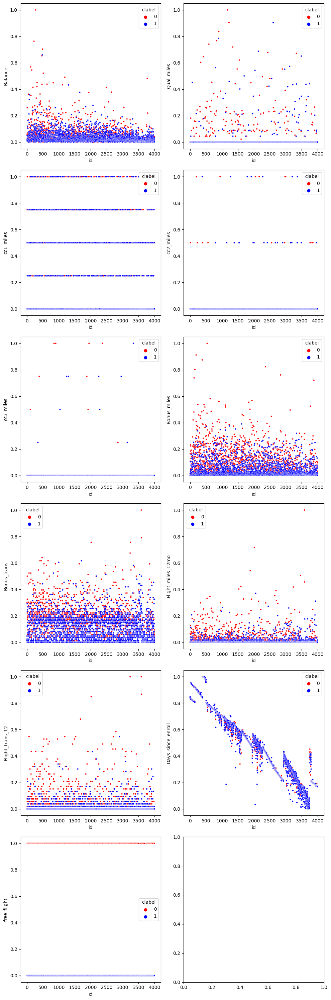

In [46]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(agg_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

The clustering is based on whether the customer got a free flight or not

## KMeans

### For raw data

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

<Axes: >

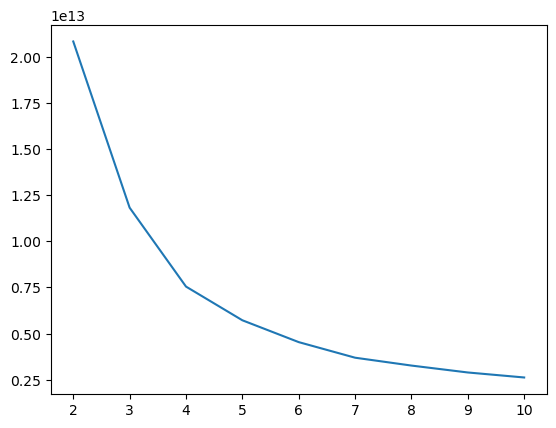

In [47]:
# Using Elbow method to find optimal number of clusters
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)
sns.lineplot(x = range(2, 11), y = wcss)

The elbow could be at 3 or 4

In [48]:
for i in range(2,6):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df)
    print(f"For {i} clusters, silhouette score is {silhouette_score(df, kmeans.labels_)}")

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 2 clusters, silhouette score is 0.7418962153707291


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 3 clusters, silhouette score is 0.6299367438777674


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 4 clusters, silhouette score is 0.5906749471074476


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 5 clusters, silhouette score is 0.5446683491320438


2 clusters have the highest silhouette score

#### For 2 clusters

In [49]:
# Creating KMeans model
kmeans = KMeans(n_clusters=2)
kmeans.fit(df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


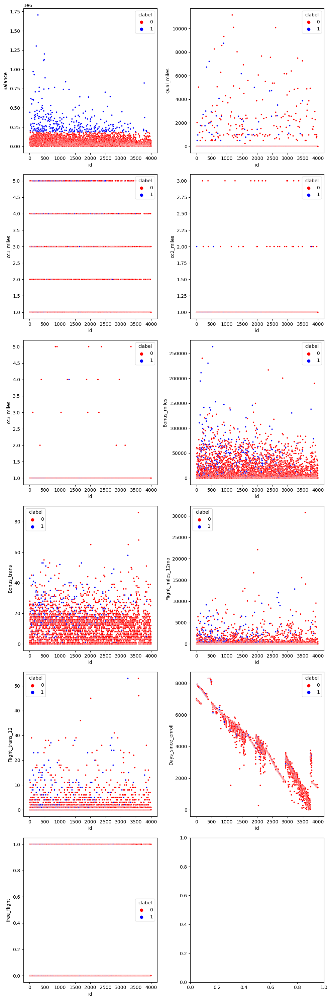

In [50]:
# Visualizing clusters for all features
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

It seems the clusters have formed based on balance

#### For 3 clusters

In [51]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


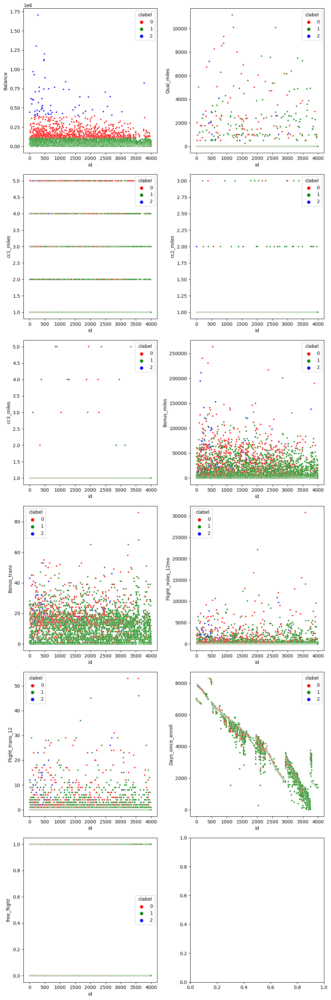

In [52]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red','green','blue'], ax=ax[i])
plt.tight_layout()

It seems the clusters have formed based on balance

#### For 4 clusters

In [53]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


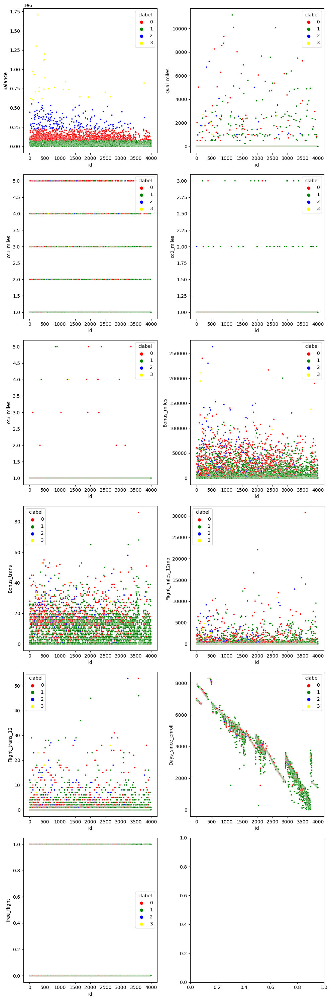

In [54]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'green', 'blue', 'yellow'], ax=ax[i])
plt.tight_layout()

It seems the clusters have formed based on balance

### For standardized data

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

<Axes: >

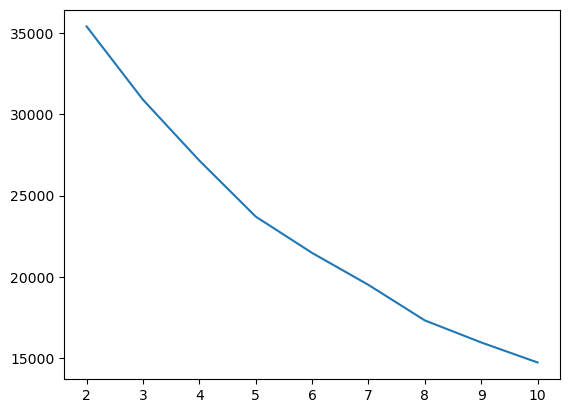

In [55]:
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(std_df)
    wcss.append(kmeans.inertia_)
sns.lineplot(x = range(2, 11), y = wcss)

The elbow could be at 4 or 6

In [56]:
for i in range(2,7):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(std_df)
    print(f"For {i} clusters, silhouette score is {silhouette_score(std_df, kmeans.labels_)}")

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 2 clusters, silhouette score is 0.32542136327826215


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 3 clusters, silhouette score is 0.31120106054803415


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 4 clusters, silhouette score is 0.3098024409856972


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 5 clusters, silhouette score is 0.2686155208281532


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 6 clusters, silhouette score is 0.2787713458070332


2 clusters have the highest silhouette score

#### For 2 clusters

In [57]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(std_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([std_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


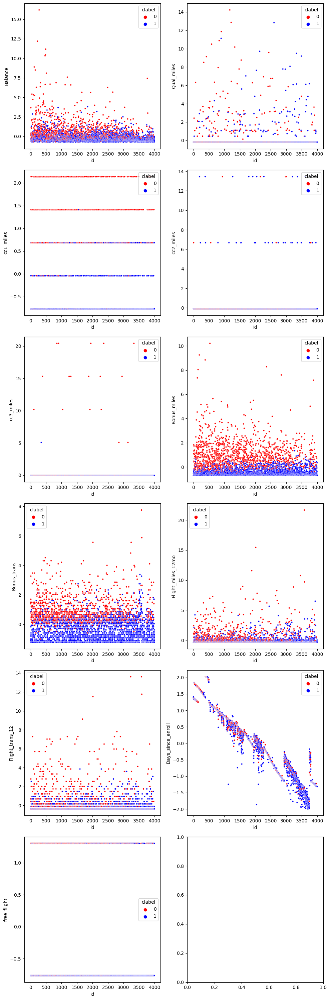

In [58]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

It seems the clusters have formed based on bonus miles

#### For 3 clusters

In [59]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(std_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([std_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


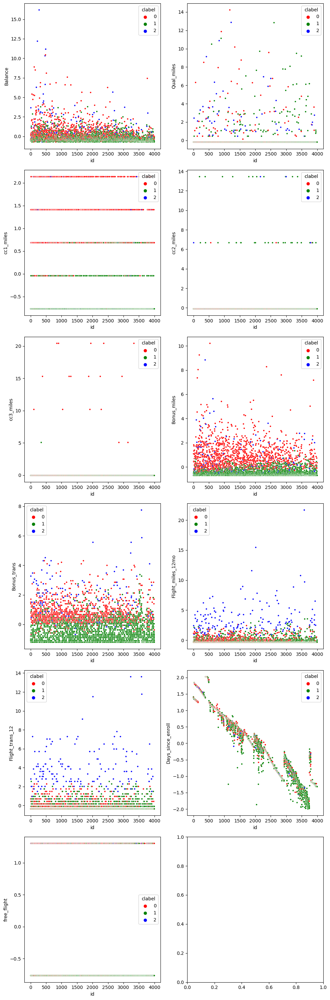

In [60]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red','green','blue'], ax=ax[i])
plt.tight_layout()

#### For 4 clusters

In [61]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(std_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([std_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


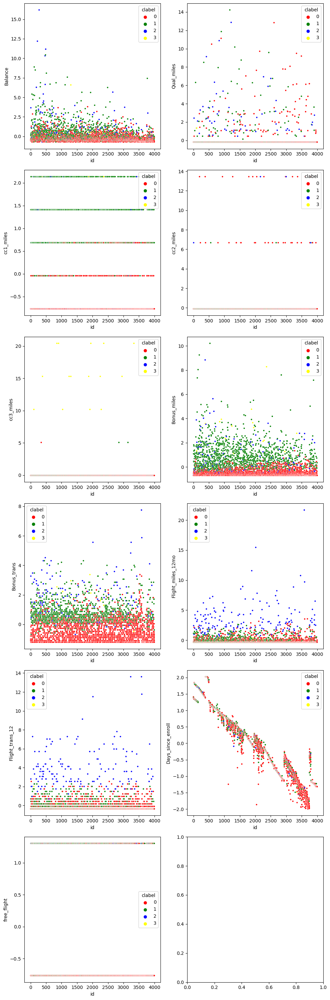

In [62]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'green', 'blue', 'yellow'], ax=ax[i])
plt.tight_layout()

### For Normalized data

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

<Axes: >

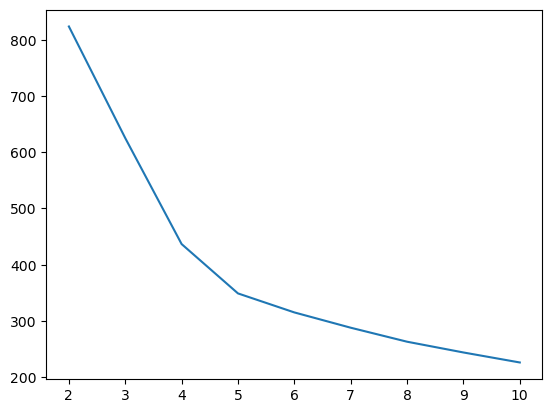

In [63]:
wcss = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(norm_df)
    wcss.append(kmeans.inertia_)
sns.lineplot(x = range(2, 11), y = wcss)

The elbow could be at 4 or 5

In [64]:
for i in range(2,7):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(norm_df)
    print(f"For {i} clusters, silhouette score is {silhouette_score(norm_df, kmeans.labels_)}")

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 2 clusters, silhouette score is 0.535930510919477


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 3 clusters, silhouette score is 0.46484529388583046


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 4 clusters, silhouette score is 0.47483765255961


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 5 clusters, silhouette score is 0.4430672072796034


C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For 6 clusters, silhouette score is 0.4021621004641961


2 clusters have the highest silhouette score

#### For 2 clusters

In [65]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(norm_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([norm_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


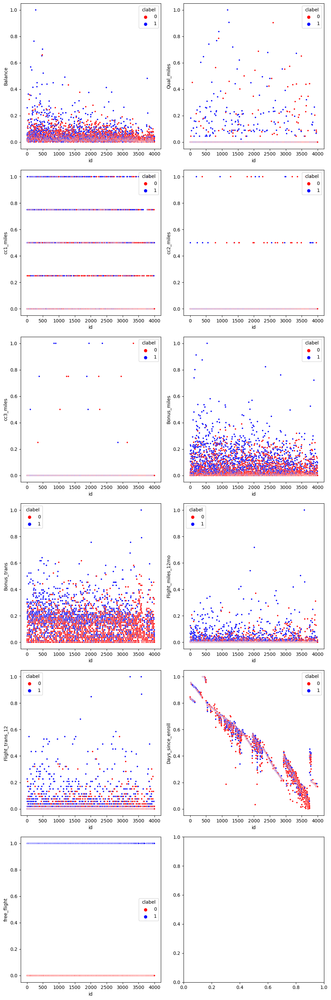

In [66]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'blue'], ax=ax[i])
plt.tight_layout()

It seems the clusters have formed based on free flight

#### For 3 clusters

In [67]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(norm_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([norm_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


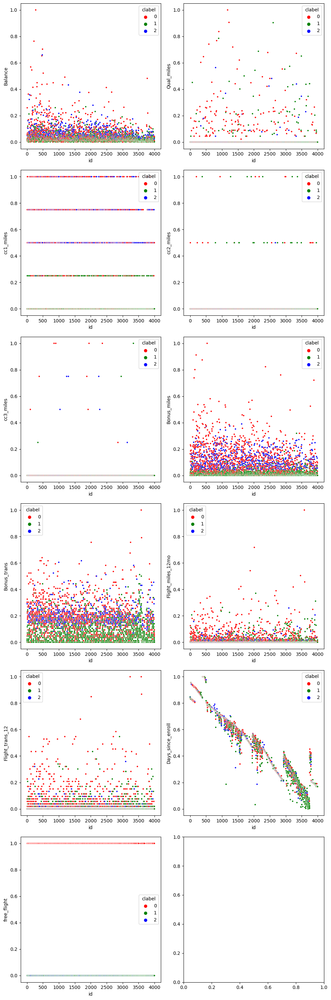

In [68]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red','green','blue'], ax=ax[i])
plt.tight_layout()

#### For 4 clusters

In [69]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(norm_df)
clabel = pd.DataFrame(kmeans.labels_, columns = ['clabel'])
kmeans_clustered = pd.concat([norm_df, clabel], axis = 1)
kmeans_clustered.sort_values(['clabel'])
kmeans_clustered['id'] = kmeans_clustered.index

C:\Users\harsh\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


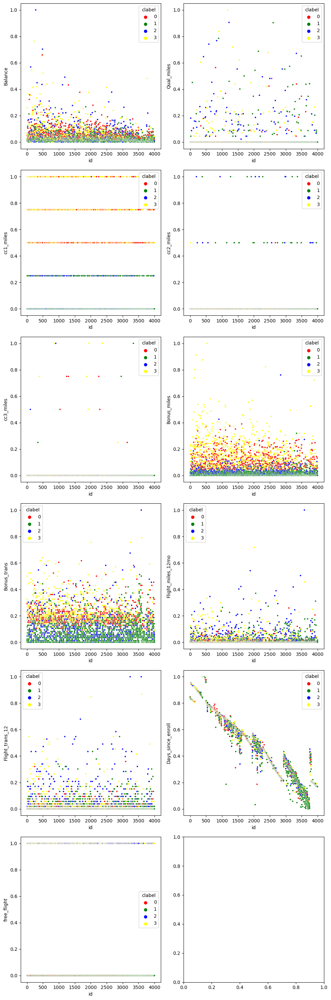

In [70]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(kmeans_clustered, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red', 'green', 'blue', 'yellow'], ax=ax[i])
plt.tight_layout()

### It is unclear what the clustering is based on

## DBSCAN

### For standardized data

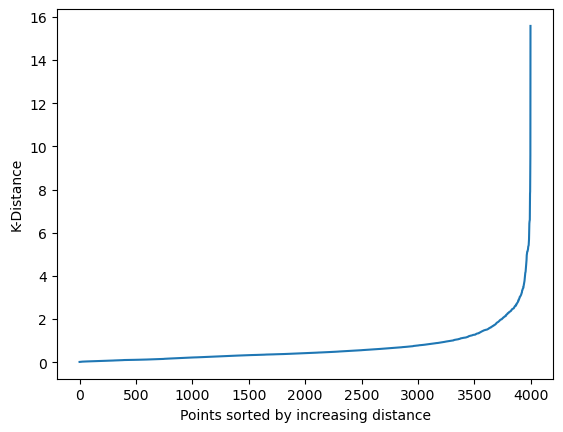

In [71]:
# Finding optimal value for eps using k distance graph

from sklearn.neighbors import NearestNeighbors

# Compute the k-distances
nbrs = NearestNeighbors().fit(std_df)
distances, indices = nbrs.kneighbors(std_df)
k_distances = distances[:, -1]
# Sort the k-distances in ascending order
k_distances_sorted = np.sort(k_distances)
# Plot the sorted k-distances
plt.plot(np.arange(len(std_df)), k_distances_sorted)      
plt.xlabel('Points sorted by increasing distance')
plt.ylabel('K-Distance')
plt.show()

We can see that the optimal value is between 1 and 3

In [72]:
# Define the parameter grid
param_grid = {
    'eps': np.linspace(2, 4, 41),
    'min_samples': np.arange(21, 30)
}

# Perform grid search with silhouette score as the evaluation metric
best_score = -1
for eps in param_grid['eps']:
    for min_samples in param_grid['min_samples']:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(std_df)
        labels = dbscan.labels_
        score = silhouette_score(std_df, labels)
        if score > best_score:
            best_score = score
            best_eps = eps
            best_min_samples = min_samples

# Print the best hyperparameters and silhouette score
print('Best eps:', best_eps)
print('Best min_samples:', best_min_samples)
print('Best silhouette score:', best_score)


Best eps: 3.95
Best min_samples: 27
Best silhouette score: 0.6908331356193184


In [73]:
# Creating DBSCAN model for optimal hyperparameters
dbscan = DBSCAN(eps=3.95, min_samples=27)
dbscan.fit(std_df)
clabel = pd.DataFrame(dbscan.labels_, columns = ['clabel'])
dbscanned = pd.concat([std_df, clabel], axis = 1)
dbscanned.sort_values(['clabel'])
dbscanned['id'] = dbscanned.index

In [74]:
dbscanned.clabel.value_counts()

 0    3901
-1      98
Name: clabel, dtype: int64

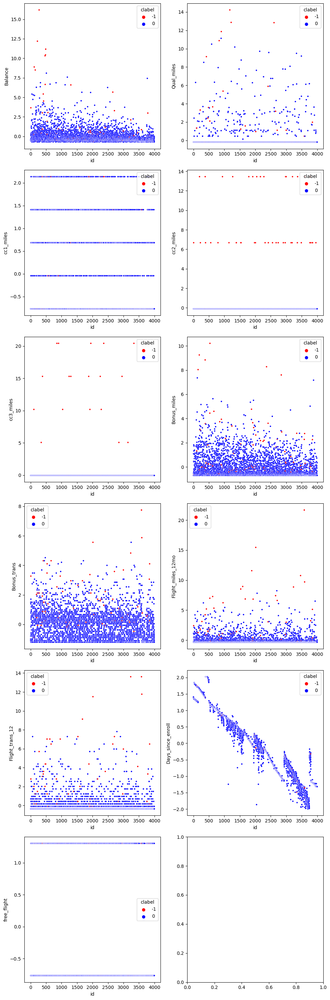

In [75]:
# Visualizing clusters for each feature
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(dbscanned, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red','blue'], ax=ax[i])
plt.tight_layout()

cc2_miles, cc3_miles with values 2 or higher are not clustered

### For Normalized data

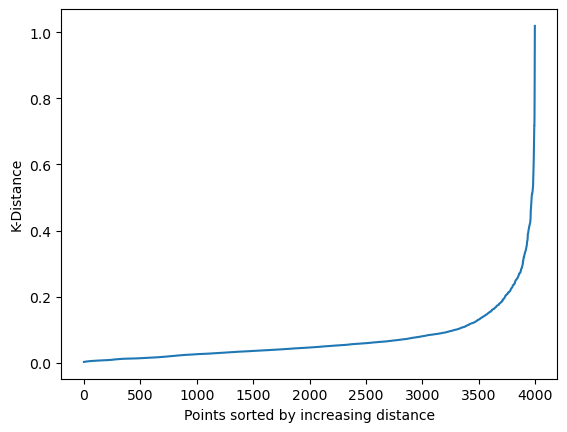

In [76]:
# Finding optimal value for eps using k distance graph

from sklearn.neighbors import NearestNeighbors

# Compute the k-distances
nbrs = NearestNeighbors().fit(norm_df)
distances, indices = nbrs.kneighbors(norm_df)
k_distances = distances[:, -1]
# Sort the k-distances in ascending order
k_distances_sorted = np.sort(k_distances)
# Plot the sorted k-distances
plt.plot(np.arange(len(norm_df)), k_distances_sorted)      
plt.xlabel('Points sorted by increasing distance')
plt.ylabel('K-Distance')
plt.show()

We can see that the optimal value is between 0.1 and 0.4

In [77]:
# Define the parameter grid
param_grid = {
    'eps': np.linspace(0.3, 0.5, 11),
    'min_samples': np.arange(11, 30)
}

# Perform grid search with silhouette score as the evaluation metric
best_score = -1
for eps in param_grid['eps']:
    for min_samples in param_grid['min_samples']:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(norm_df)
        labels = dbscan.labels_
        score = silhouette_score(norm_df, labels)
        if score > best_score:
            best_score = score
            best_eps = eps
            best_min_samples = min_samples

# Print the best hyperparameters and silhouette score
print('Best eps:', best_eps)
print('Best min_samples:', best_min_samples)
print('Best silhouette score:', best_score)


Best eps: 0.42
Best min_samples: 25
Best silhouette score: 0.5270155657737517


In [78]:
dbscan = DBSCAN(eps=0.42, min_samples=25)
dbscan.fit(norm_df)
clabel = pd.DataFrame(dbscan.labels_, columns = ['clabel'])
dbscanned = pd.concat([norm_df, clabel], axis = 1)
dbscanned.sort_values(['clabel'])
dbscanned['id'] = dbscanned.index

In [79]:
dbscanned.clabel.value_counts()

 0    2486
 1    1439
-1      74
Name: clabel, dtype: int64

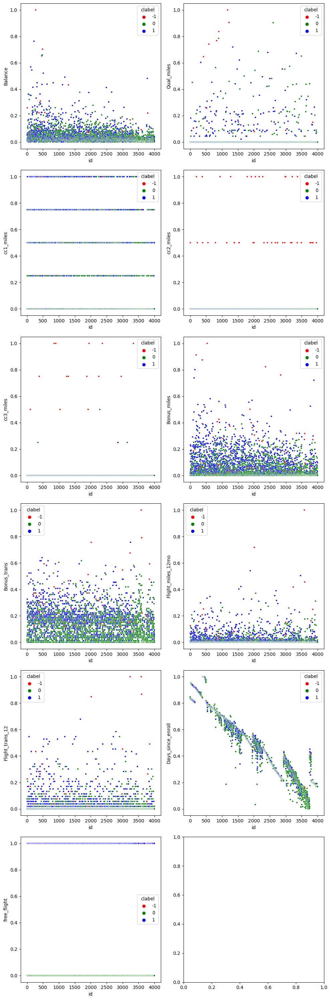

In [80]:
disp_cols = ['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'free_flight']
fig, axes = plt.subplots(6,2,figsize=(10,30))
ax = np.array(axes).reshape(-1)
for i, column in zip(range(len(disp_cols)), disp_cols):
    sns.scatterplot(dbscanned, x = 'id', y =column, hue = 'clabel', s = 10, palette=['red','green','blue'], ax=ax[i])
plt.tight_layout()

In [81]:
dbscanned.groupby('clabel').agg(['min', 'max', 'median', 'mean']).T

clabel                             -1            0            1
Balance           min        0.002433     0.000029     0.000000
                  max        1.000000     0.659931     0.763739
                  median     0.031922     0.021824     0.032168
                  mean       0.081121     0.034948     0.055428
Qual_miles        min        0.000000     0.000000     0.000000
                  max        1.000000     0.903660     0.719322
                  median     0.000000     0.000000     0.000000
                  mean       0.076090     0.007959     0.018262
cc1_miles         min        0.000000     0.000000     0.000000
                  max        1.000000     1.000000     1.000000
                  median     0.000000     0.000000     0.500000
                  mean       0.226351     0.177293     0.418172
cc2_miles         min        0.000000     0.000000     0.000000
                  max        1.000000     0.000000     0.000000
                  median     0.500000     0.000000     0.000000
                  mean       0.391892     0.000000     0.000000
cc3_miles         min        0.000000     0.000000     0.000000
                  max        1.000000     0.500000     0.250000
                  median     0.000000     0.000000     0.000000
                  mean       0.148649     0.000402     0.000174
Bonus_miles       min        0.006648     0.000000     0.000000
                  max        1.000000     0.390011     0.801274
                  median     0.061098     0.012325     0.072719
                  mean       0.170931     0.038126     0.106036
Bonus_trans       min        0.058140     0.000000     0.000000
                  max        1.000000     0.616279     0.755814
                  median     0.203488     0.093023     0.174419
                  mean       0.273256     0.105297     0.178944
Flight_miles_12mo min        0.000000     0.000000     0.000000
                  max        1.000000     0.370185     0.541097
                  median     0.004056     0.000000     0.000000
                  mean       0.066202     0.007352     0.025381
Flight_trans_12   min        0.000000     0.000000     0.000000
                  max        1.000000     0.547170     0.679245
                  median     0.018868     0.000000     0.000000
                  mean       0.112953     0.012295     0.044974
Days_since_enroll min        0.063781     0.000000     0.036050
                  max        1.000000     1.000000     1.000000
                  median     0.499879     0.449240     0.562214
                  mean       0.525621     0.460741     0.556307
free_flight       min        0.000000     0.000000     1.000000
                  max        1.000000     0.000000     1.000000
                  median     1.000000     0.000000     1.000000
                  mean       0.567568     0.000000     1.000000
id                min        8.000000     0.000000     4.000000
                  max     3959.000000  3998.000000  3996.000000
                  median  1961.000000  2209.000000  1658.000000
                  mean    1965.445946  2154.400644  1732.257123

It is unclear what the clustering is based on